# 공통적인 전처리
# Common Data Preprocessing


In [19]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
from wordcloud import WordCloud
from collections import Counter

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic'

# 그래프에서 마이너스 기호 깨지는 문제 해결
plt.rcParams['axes.unicode_minus'] = False

# 데이터 파일 경로 설정
file_paths = [
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv",
]

# CSV 파일을 읽고 하나의 DataFrame으로 결합
df_list = []
for file_path in file_paths:
    df_temp = pd.read_csv(file_path)
    df_temp['파일경로'] = os.path.basename(file_path)
    df_list.append(df_temp)
df = pd.concat(df_list, ignore_index=True)

# 날짜 형식을 datetime으로 변환
df['게시일'] = pd.to_datetime(df['게시일'], errors='coerce')

# 요일과 시간대 추출
df['요일'] = df['게시일'].dt.day_name()
df['시간대'] = df['게시일'].dt.hour

# '조회수', '좋아요 수', '댓글 수', '동영상 수' 열에서 쉼표 제거 및 숫자로 변환
df['조회수'] = df['조회수'].astype(str).str.replace(',', '', regex=False)
df['좋아요 수'] = df['좋아요 수'].astype(str).str.replace(',', '', regex=False)
df['댓글 수'] = df['댓글 수'].astype(str).str.replace(',', '', regex=False)
df['동영상 수'] = df['동영상 수'].astype(str).str.replace(',', '', regex=False)

df['조회수'] = pd.to_numeric(df['조회수'], errors='coerce').fillna(0).astype(int)
df['좋아요 수'] = pd.to_numeric(df['좋아요 수'], errors='coerce').fillna(0).astype(int)
df['댓글 수'] = pd.to_numeric(df['댓글 수'], errors='coerce').fillna(0).astype(int)
df['동영상 수'] = pd.to_numeric(df['동영상 수'], errors='coerce').fillna(0).astype(int)

# '영상 수' 컬럼이 존재하는지 확인 후 변환
if '동영상 수' in df.columns:
    df['동영상 수'] = df['동영상 수'].astype(str).str.replace(',', '', regex=False)
    df['동영상 수'] = pd.to_numeric(df['동영상 수'], errors='coerce').fillna(0).astype(int)

# '요일' 컬럼을 카테고리로 변환, '미정' 추가 및 결측값 처리
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['요일'] = pd.Categorical(df['요일'], categories=day_order, ordered=True)
df['요일'] = df['요일'].cat.add_categories('미정').fillna('미정')

# '미정' 값을 가진 행 제거
df = df[df['요일'] != '미정']

# 나머지 결측값을 0으로 채움 (카테고리 컬럼 제외)
number_columns = ['조회수', '좋아요 수', '댓글 수']
if '동영상 수' in df.columns:
    number_columns.append('동영상 수')

df[number_columns] = df[number_columns].fillna(0)

# 쇼츠 영상 제거 (비디오 길이가 60초 이하인 비디오 제외)
play_time_col = '재생 시간(분)'  # 실제 열 이름에 맞게 조정
if play_time_col in df.columns:
    df = df[df[play_time_col] > 60]
else:
    print(f"DataFrame에서 '{play_time_col}' 열을 찾을 수 없습니다.")

# Combine data from all channels
df_combined = df.copy()


DataFrame에서 '재생 시간(분)' 열을 찾을 수 없습니다.


# 1. 워드클라우드 - 분야별 & 채널별
# 1. Word Cloud Analysis - By Category & Channel

## -> 분야별 상위 5명의 유튜버들이 제목에 자주 사용하는 단어
## -> Most frequently used words in video titles by top 5 YouTubers in each category


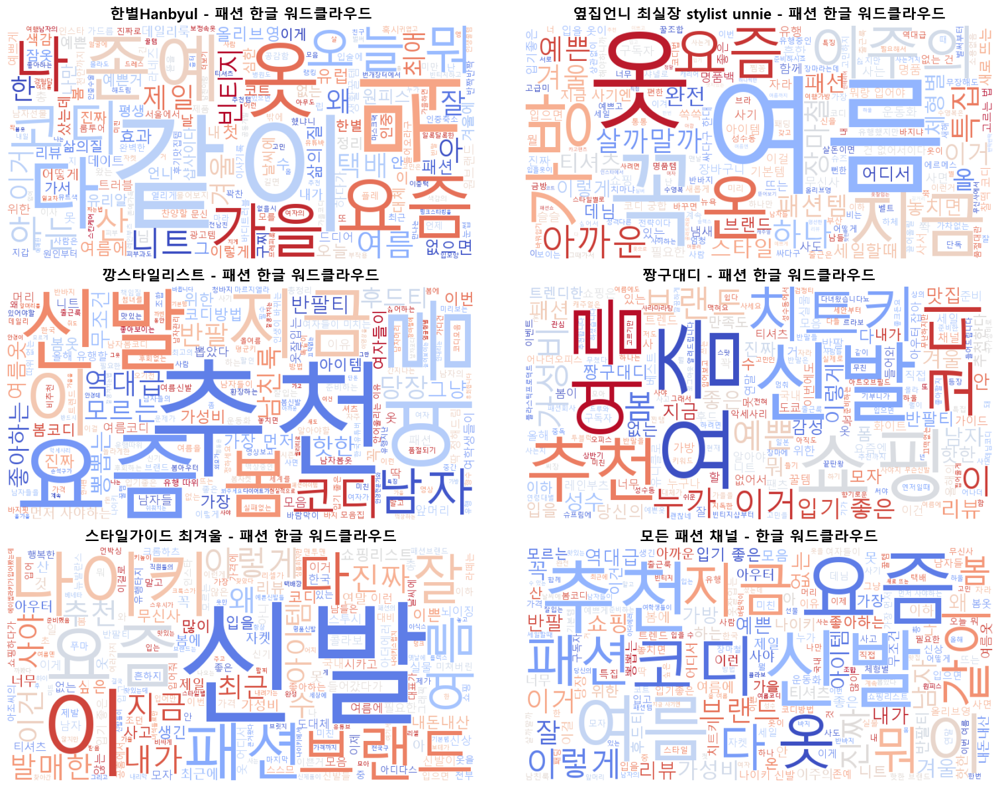

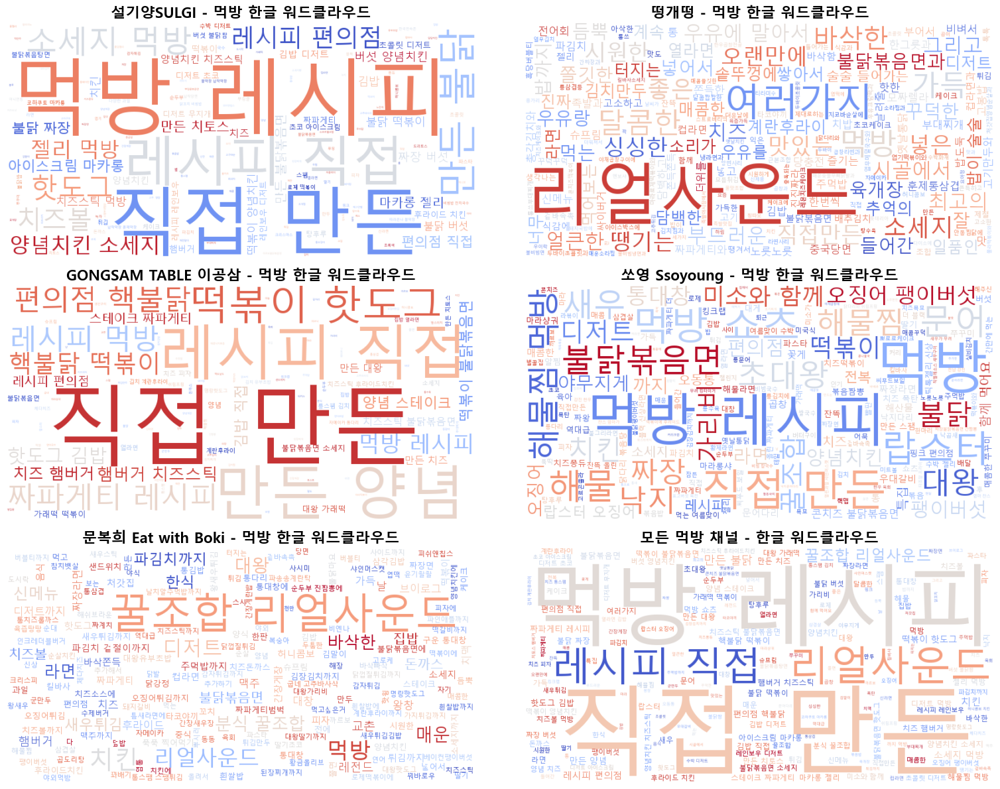

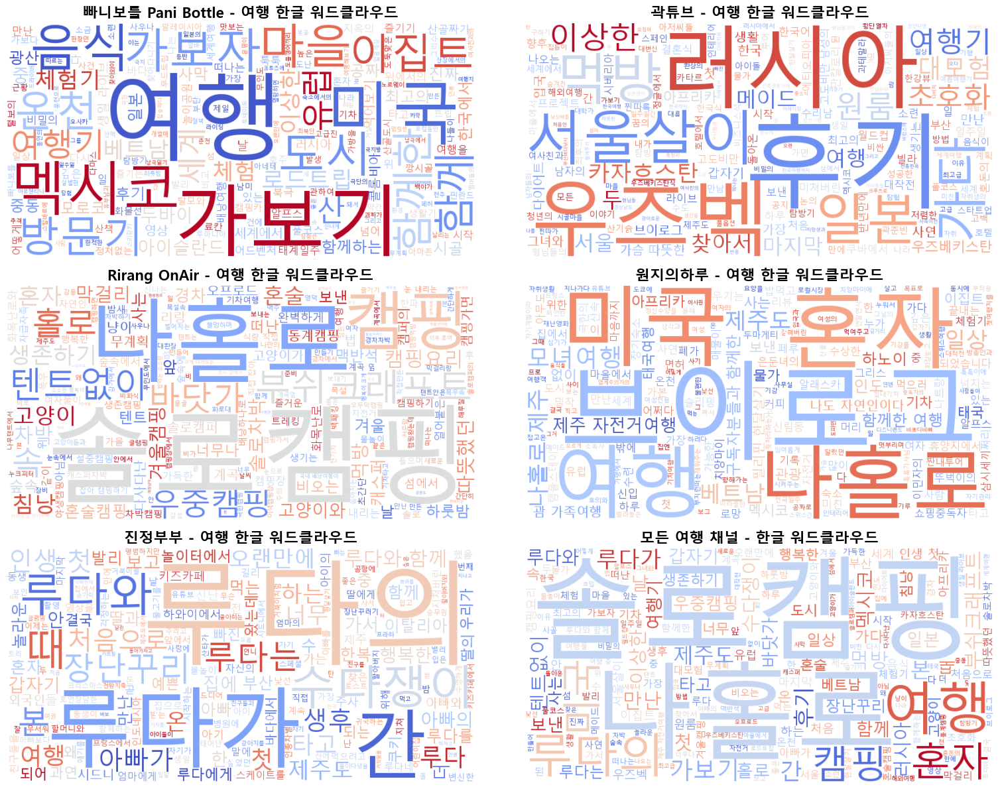

In [101]:
from wordcloud import WordCloud
import pandas as pd
import matplotlib.pyplot as plt
import os

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  

# 그래프에서 마이너스 기호 깨지는 문제 해결
plt.rcParams['axes.unicode_minus'] = False

# 데이터 파일 경로 설정
file_paths = [
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv",
]

# 데이터 읽기 및 처리
dfs = []
for file_path in file_paths:
    df = pd.read_csv(file_path)
    
    # 쉼표 제거 및 숫자로 변환
    df['조회수'] = df['조회수'].astype(str).str.replace(',', '')
    df['좋아요 수'] = df['좋아요 수'].astype(str).str.replace(',', '')
    df['댓글 수'] = df['댓글 수'].astype(str).str.replace(',', '')
    df['동영상 수'] = df['동영상 수'].astype(str).str.replace(',', '')

    df['조회수'] = pd.to_numeric(df['조회수'], errors='coerce').fillna(0).astype(int)
    df['좋아요 수'] = pd.to_numeric(df['좋아요 수'], errors='coerce').fillna(0).astype(int)
    df['댓글 수'] = pd.to_numeric(df['댓글 수'], errors='coerce').fillna(0).astype(int)
    df['동영상 수'] = pd.to_numeric(df['동영상 수'], errors='coerce').fillna(0).astype(int)

    # 파일 경로 정보 추가
    df['파일경로'] = os.path.basename(file_path)
    
    dfs.append(df)

# 모든 데이터프레임을 하나로 결합
df_combined = pd.concat(dfs, ignore_index=True)

# 한글 워드클라우드 생성 함수
def generate_wordcloud(text, title, ax, font_path=None):
    wordcloud = WordCloud(
        width=800, height=400,
        background_color='white',
        font_path=font_path,  # 한글 폰트 경로 지정
        colormap='coolwarm',  # 색상 팔레트
        contour_color='black',  # 윤곽선 색상
        contour_width=1  # 윤곽선 두께
    ).generate(text)
    
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title, fontsize=16, weight='bold')  # 제목 폰트 크기와 두께 조정

# 각 카테고리별 제목 결합
def combine_titles(dataframe):
    titles = " ".join(dataframe['제목'].dropna().tolist())
    # 한글 제목만 필터링
    korean_titles = " ".join([word for word in titles.split() if all(u'\uac00' <= char <= u'\ud7a3' for char in word)])
    return korean_titles

# 카테고리별 데이터프레임 필터링
youtube_fashion = df_combined[df_combined['파일경로'].str.contains('youtube_fashion_data.csv')]
youtube_mukbang = df_combined[df_combined['파일경로'].str.contains('youtube_mukbang_data.csv')]
youtube_travel = df_combined[df_combined['파일경로'].str.contains('youtube_travel_data.csv')]

# 각 채널별 및 카테고리별 워드클라우드 생성 및 출력
def plot_wordclouds_by_category_and_channel(dataframe, category_name, font_path):
    channels = dataframe['채널명'].unique()
    num_channels = len(channels)

    fig, axes = plt.subplots(nrows=(num_channels + 1) // 2, ncols=2, figsize=(16, 4 * (num_channels // 2 + 1)))
    axes = axes.flatten()
    
    # 각 채널별 워드클라우드 생성
    for i, channel in enumerate(channels):
        channel_data = dataframe[dataframe['채널명'] == channel]
        korean_titles = combine_titles(channel_data)
        if korean_titles.strip():
            generate_wordcloud(korean_titles, f'{channel} - {category_name} 한글 워드클라우드', axes[i], font_path=font_path)

    # 전체 카테고리 워드클라우드 생성
    korean_titles = combine_titles(dataframe)
    if korean_titles.strip():
        generate_wordcloud(korean_titles, f'모든 {category_name} 채널 - 한글 워드클라우드', axes[-1], font_path=font_path)
    
    plt.tight_layout()
    plt.show()

# 각 카테고리별 워드클라우드 생성 및 출력
plot_wordclouds_by_category_and_channel(youtube_fashion, '패션', font_path='C:\\Windows\\Fonts\\malgun.ttf')
plot_wordclouds_by_category_and_channel(youtube_mukbang, '먹방', font_path='C:\\Windows\\Fonts\\malgun.ttf')
plot_wordclouds_by_category_and_channel(youtube_travel, '여행', font_path='C:\\Windows\\Fonts\\malgun.ttf')


# 2. 각 분야별 & 채널별 - 요일, 시간대별 평균 조회수
# 2. Upload Timing Analysis - Average Views by Day and Hour for Each Category & Channel
## -> 각 분야 및 채널별 가장 많이 나오는 조회수의 요일 및 시간대
## -> Days and hours with highest average views for each category and channel


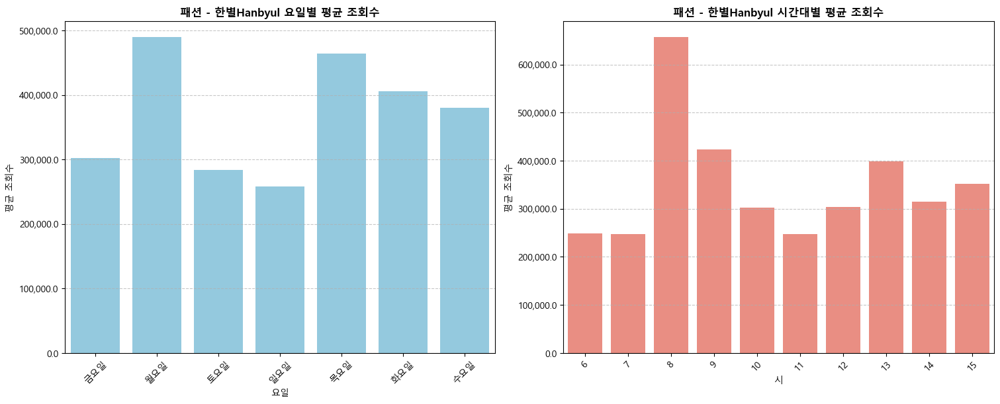

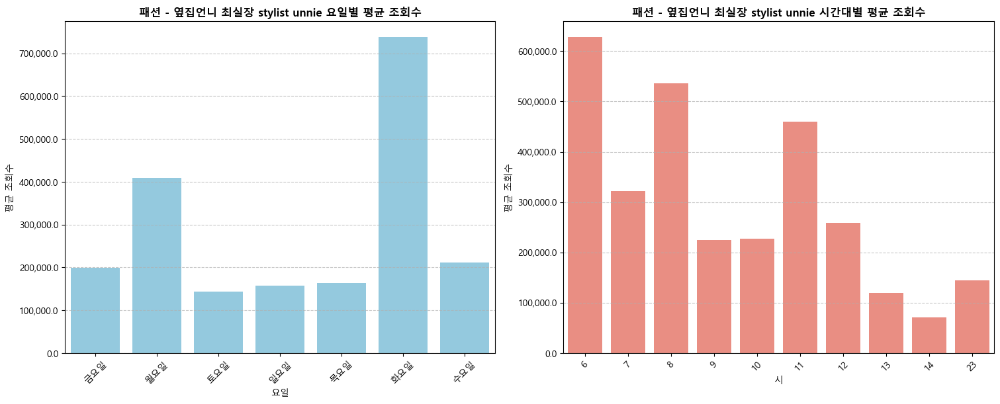

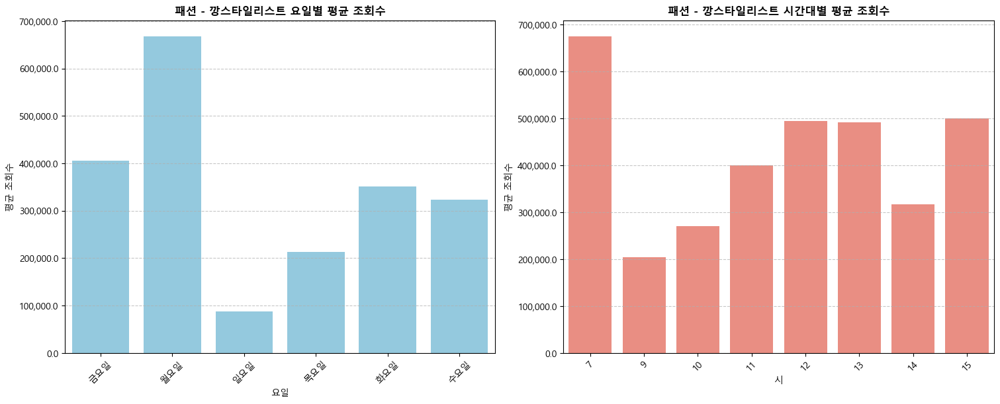

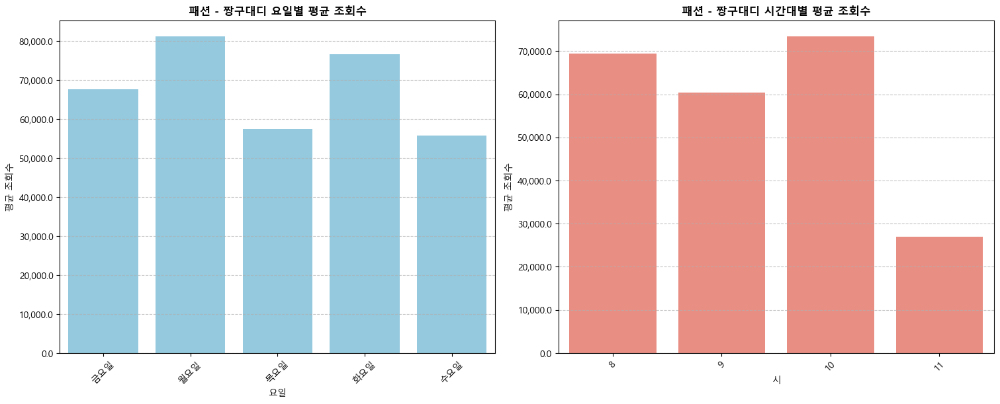

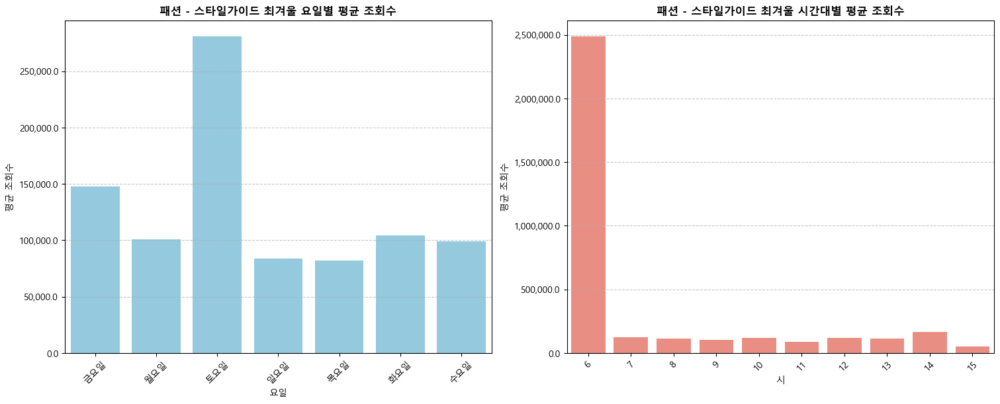

...

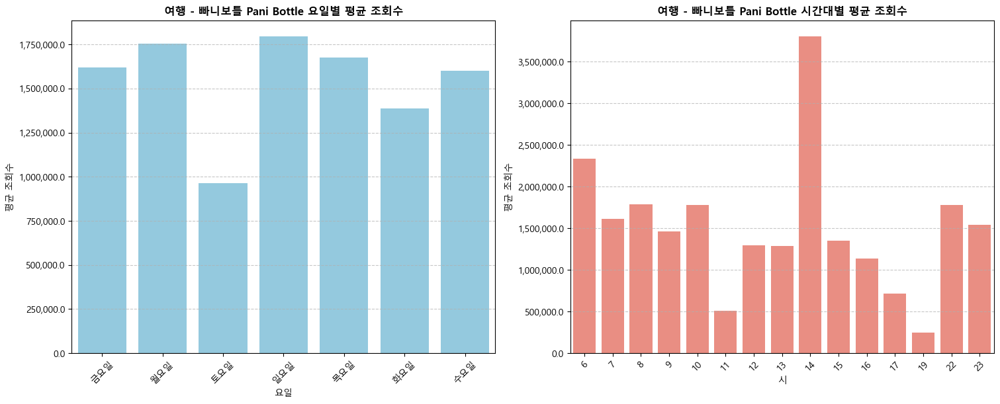

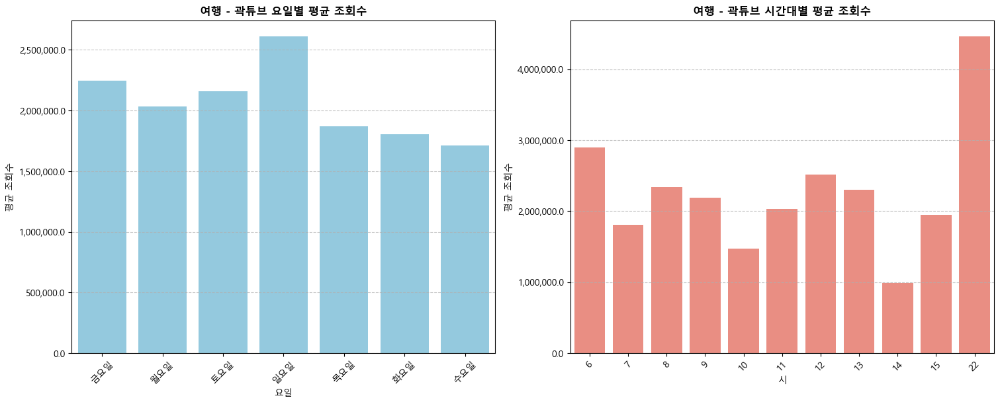

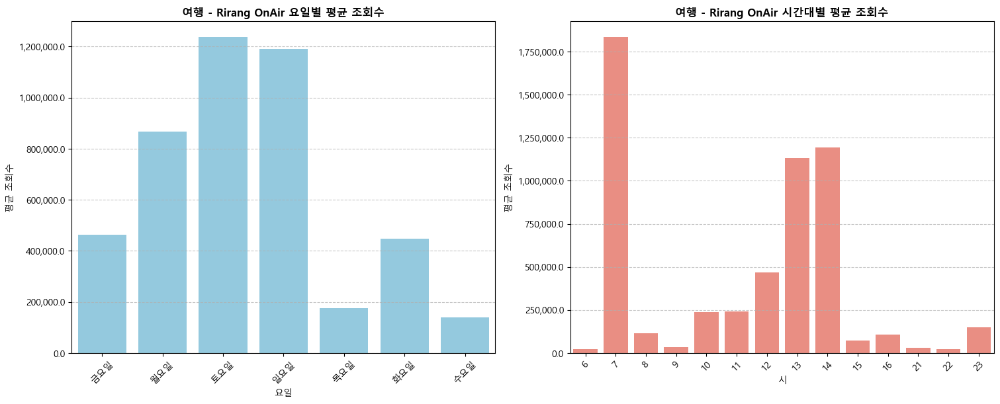

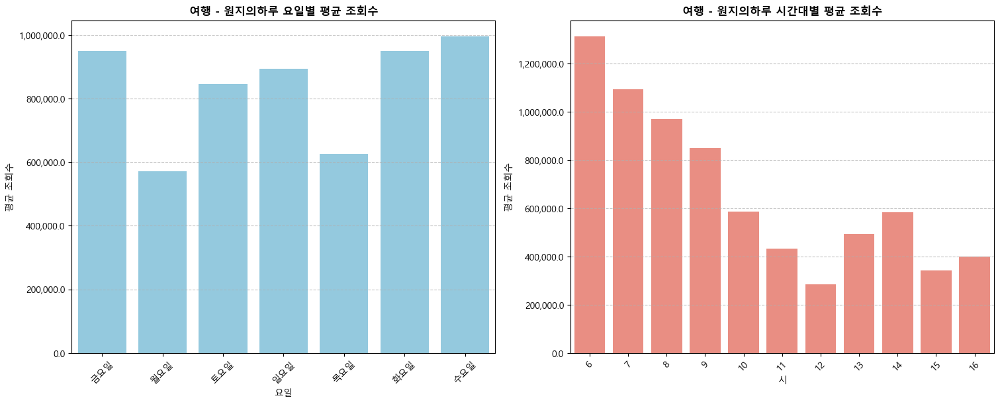

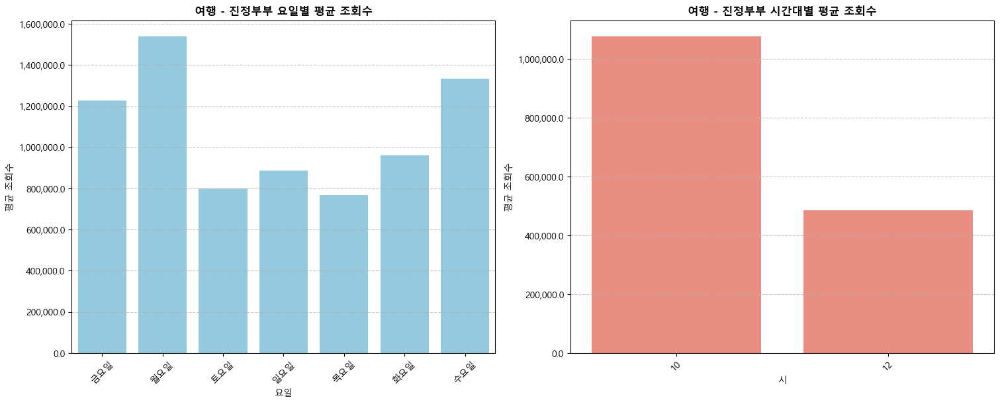

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# 요일을 한국어로 변환하기 위한 딕셔너리
weekday_korean = {
    'Monday': '월요일', 'Tuesday': '화요일', 'Wednesday': '수요일',
    'Thursday': '목요일', 'Friday': '금요일', 'Saturday': '토요일', 'Sunday': '일요일'
}

# 숫자를 천 단위로 구분하여 포맷팅하는 함수
def format_full_numbers(x, _):
    return f'{x:,}'

# 데이터 준비: 게시일을 datetime 형식으로 변환하고 요일 및 시간 정보 추출
df_combined['게시일'] = pd.to_datetime(df_combined['게시일'], errors='coerce')
df_combined['요일'] = df_combined['게시일'].dt.day_name()
df_combined['시'] = df_combined['게시일'].dt.hour

# 카테고리 목록
categories = ['Fashion', 'Mukbang', 'Travel']

# 카테고리의 한국어 제목 설정
category_titles = {
    'Fashion': '패션',
    'Mukbang': '먹방',
    'Travel': '여행'
}

for category in categories:
    category_data = df_combined[df_combined['파일경로'].str.contains(category.lower())]  # Corrected for category
    
    # 5개의 채널에 대해 시각화
    for i, channel_name in enumerate(category_data['채널명'].unique()[:5]):
        channel_data = category_data[category_data['채널명'] == channel_name]
        
        # '요일' 데이터가 있는지 확인
        if '요일' not in channel_data.columns:
            print(f"요일 column missing for {channel_name} in {category}")
            continue  # '요일' 데이터가 없으면 다음으로 넘어감

        # 데이터에서 시간대가 비현실적인 경우 필터링 (0시 ~ 5시 제외)
        channel_data = channel_data[(channel_data['시'] >= 6) & (channel_data['시'] <= 23)]

        # 요일별 평균 조회수 계산
        avg_views_by_day = channel_data.groupby('요일')['조회수'].mean()
        avg_views_by_day.index = avg_views_by_day.index.map(weekday_korean)
        
        # 시간대별 평균 조회수 계산
        avg_views_by_time = channel_data.groupby('시')['조회수'].mean()

        # 1 x 2 서브플롯 설정
        fig, axes = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)
        
        # 요일별 평균 조회수 그래프
        sns.barplot(x=avg_views_by_day.index, y=avg_views_by_day, color='skyblue', ax=axes[0])
        axes[0].set_title(f'{category_titles[category]} - {channel_name} 요일별 평균 조회수', fontsize=12, weight='bold')
        axes[0].set_xlabel('요일', fontsize=10)
        axes[0].set_ylabel('평균 조회수', fontsize=10)
        axes[0].tick_params(axis='x', rotation=45, labelsize=10)
        axes[0].yaxis.set_major_formatter(FuncFormatter(format_full_numbers))
        axes[0].grid(axis='y', linestyle='--', alpha=0.7)
        
        # 시간대별 평균 조회수 그래프
        sns.barplot(x=avg_views_by_time.index, y=avg_views_by_time, color='salmon', ax=axes[1])
        axes[1].set_title(f'{category_titles[category]} - {channel_name} 시간대별 평균 조회수', fontsize=12, weight='bold')
        axes[1].set_xlabel('시', fontsize=10)
        axes[1].set_ylabel('평균 조회수', fontsize=10)
        axes[1].tick_params(axis='x', rotation=45, labelsize=10)
        axes[1].yaxis.set_major_formatter(FuncFormatter(format_full_numbers))
        axes[1].grid(axis='y', linestyle='--', alpha=0.7)
        
        plt.show()


# 3. 각 분야별 업로드 주기에 따른 평균 조회수 및 좋아요수 파악
# 3. Upload Frequency Analysis - Average Views and Likes by Upload Interval for Each Category
## -> 가장 최적의 업로드 주기가 몇일인지 파악
## -> Determining the optimal upload frequency in days


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


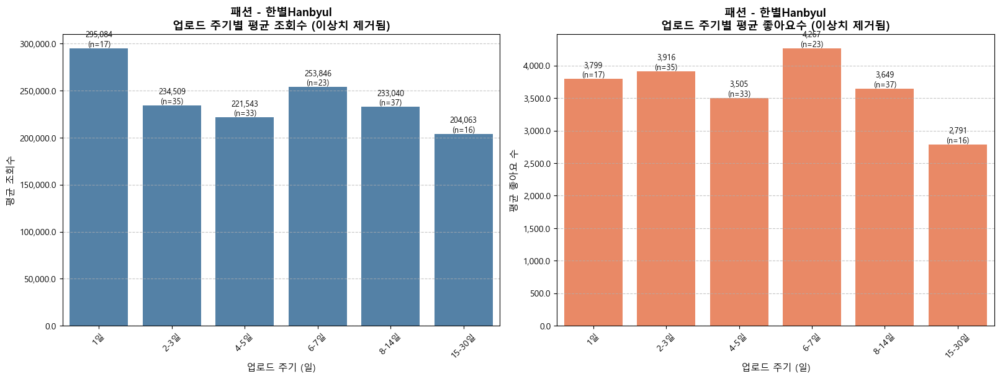


패션 - 한별Hanbyul
  최고 조회수 업로드 주기: 1일
  최고 좋아요수 업로드 주기: 6-7일
  분석된 총 영상 수: 161개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


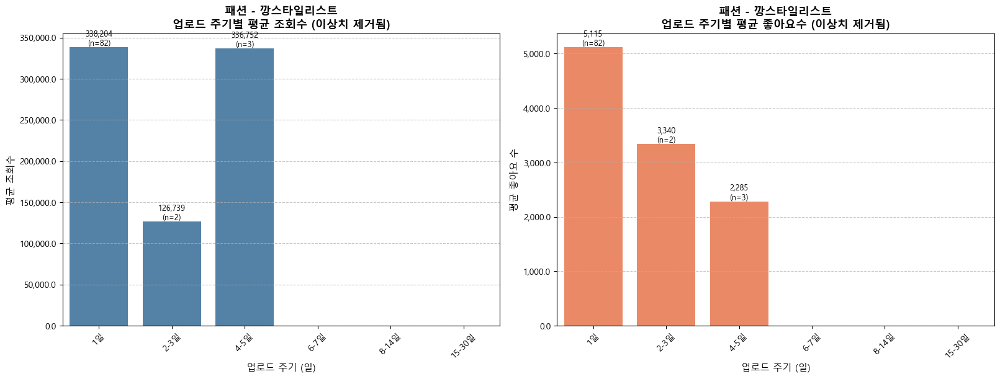


패션 - 깡스타일리스트
  최고 조회수 업로드 주기: 1일
  최고 좋아요수 업로드 주기: 1일
  분석된 총 영상 수: 87개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


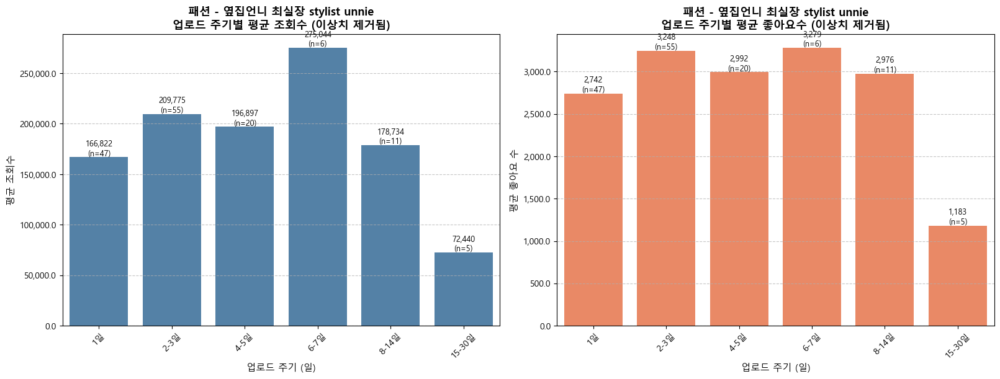


패션 - 옆집언니 최실장 stylist unnie
  최고 조회수 업로드 주기: 6-7일
  최고 좋아요수 업로드 주기: 6-7일
  분석된 총 영상 수: 144개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


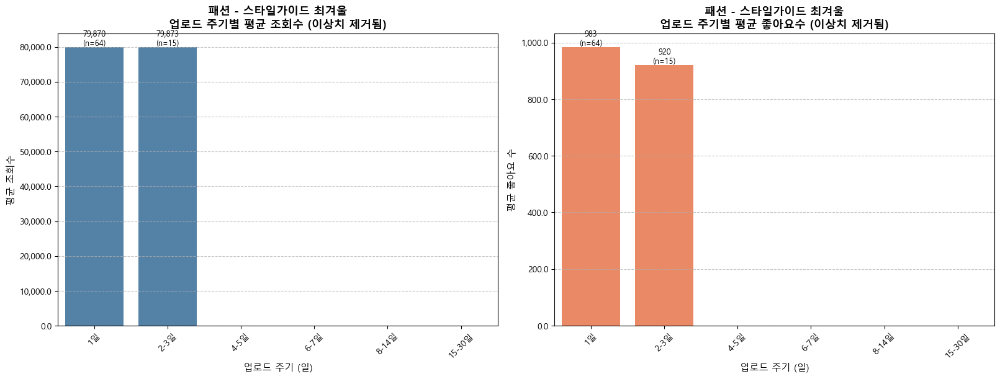


패션 - 스타일가이드 최겨울
  최고 조회수 업로드 주기: 2-3일
  최고 좋아요수 업로드 주기: 1일
  분석된 총 영상 수: 79개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


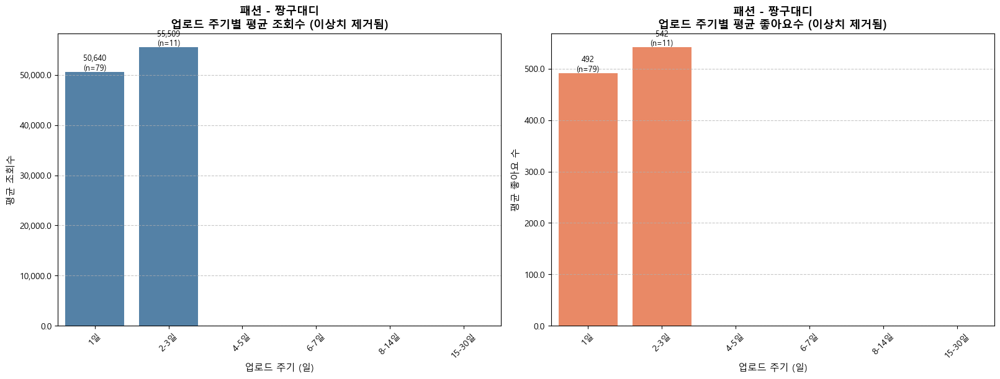


패션 - 짱구대디
  최고 조회수 업로드 주기: 2-3일
  최고 좋아요수 업로드 주기: 2-3일
  분석된 총 영상 수: 90개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


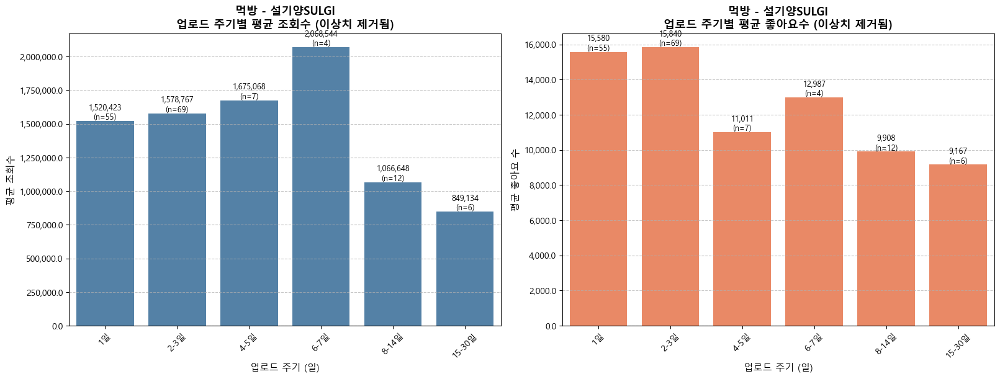


먹방 - 설기양SULGI
  최고 조회수 업로드 주기: 6-7일
  최고 좋아요수 업로드 주기: 2-3일
  분석된 총 영상 수: 153개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


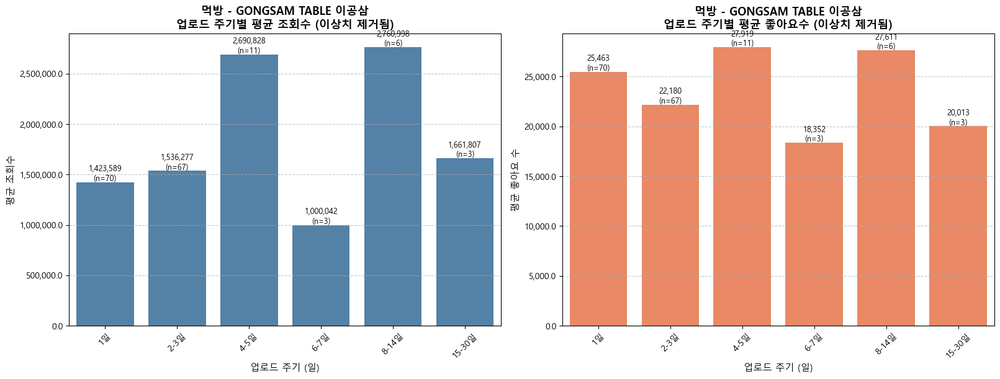


먹방 - GONGSAM TABLE 이공삼
  최고 조회수 업로드 주기: 8-14일
  최고 좋아요수 업로드 주기: 4-5일
  분석된 총 영상 수: 160개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


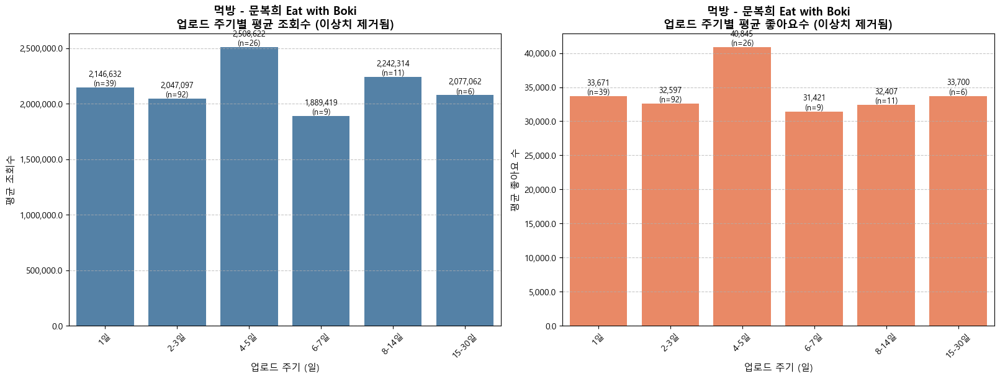


먹방 - 문복희 Eat with Boki
  최고 조회수 업로드 주기: 4-5일
  최고 좋아요수 업로드 주기: 4-5일
  분석된 총 영상 수: 183개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


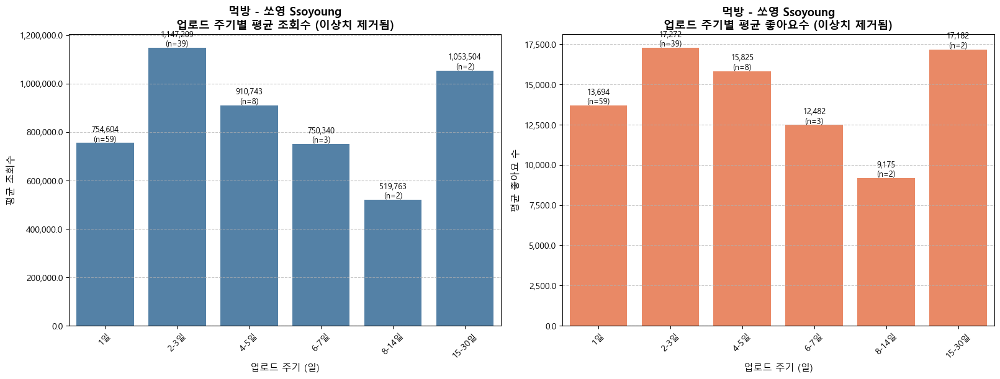


먹방 - 쏘영 Ssoyoung
  최고 조회수 업로드 주기: 2-3일
  최고 좋아요수 업로드 주기: 2-3일
  분석된 총 영상 수: 113개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


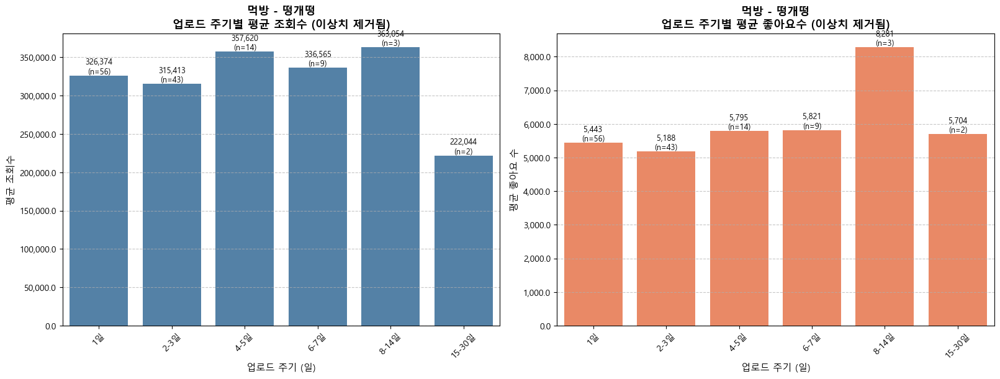


먹방 - 떵개떵
  최고 조회수 업로드 주기: 8-14일
  최고 좋아요수 업로드 주기: 8-14일
  분석된 총 영상 수: 127개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


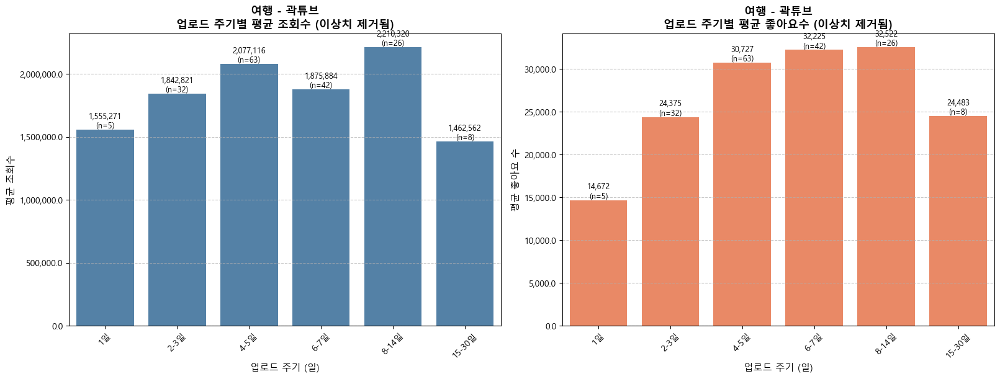


여행 - 곽튜브
  최고 조회수 업로드 주기: 8-14일
  최고 좋아요수 업로드 주기: 8-14일
  분석된 총 영상 수: 176개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


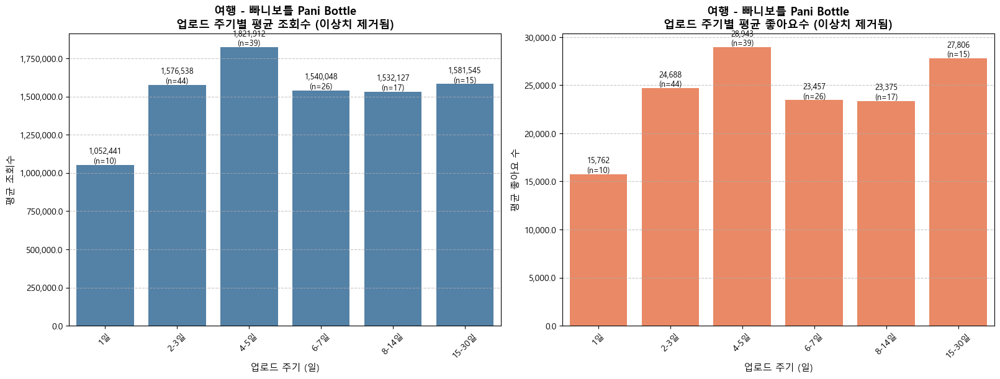


여행 - 빠니보틀 Pani Bottle
  최고 조회수 업로드 주기: 4-5일
  최고 좋아요수 업로드 주기: 4-5일
  분석된 총 영상 수: 151개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


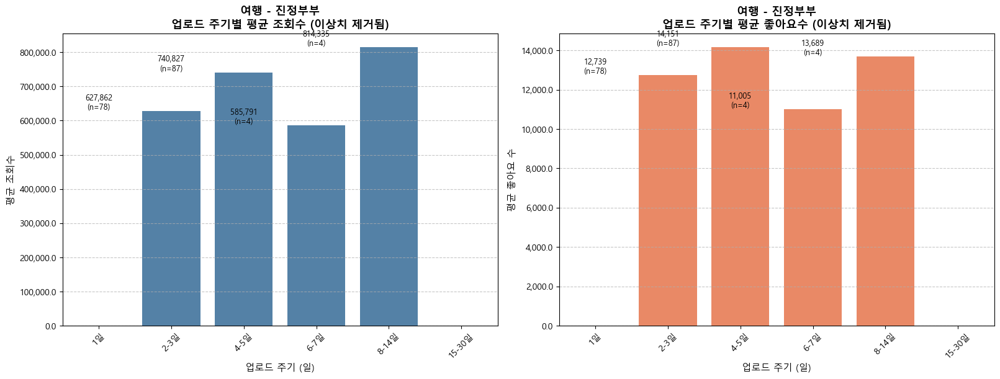


여행 - 진정부부
  최고 조회수 업로드 주기: 8-14일
  최고 좋아요수 업로드 주기: 4-5일
  분석된 총 영상 수: 173개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


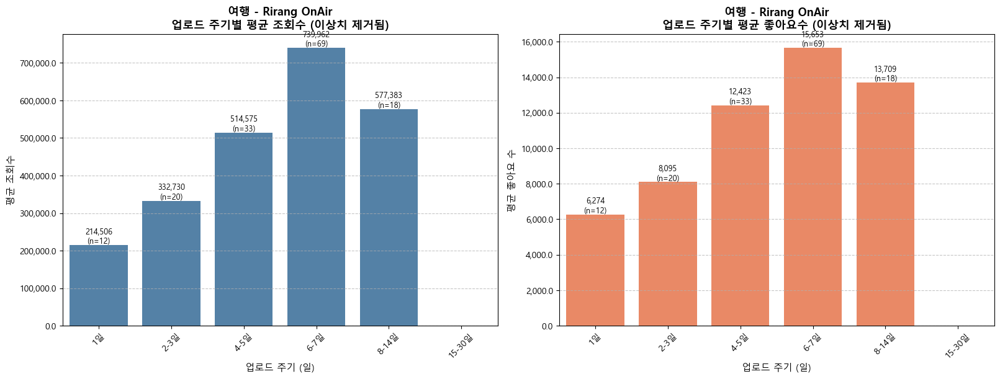


여행 - Rirang OnAir
  최고 조회수 업로드 주기: 6-7일
  최고 좋아요수 업로드 주기: 6-7일
  분석된 총 영상 수: 152개


c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
c:\Anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


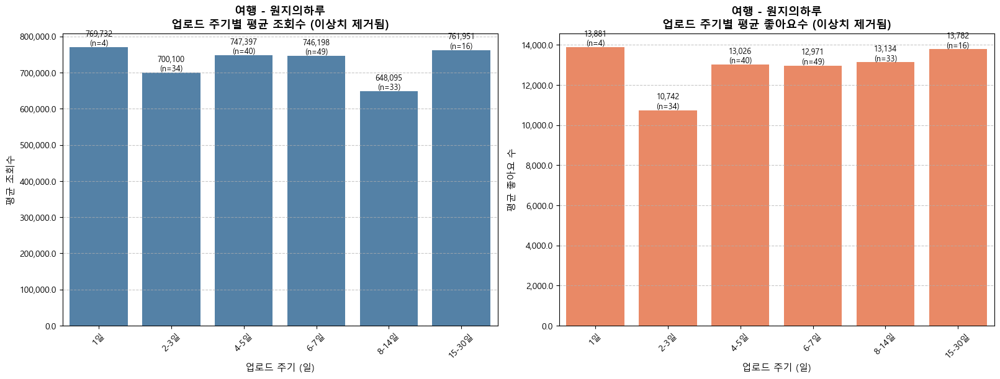


여행 - 원지의하루
  최고 조회수 업로드 주기: 1일
  최고 좋아요수 업로드 주기: 1일
  분석된 총 영상 수: 176개


In [20]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 숫자를 천 단위로 구분하여 포맷팅하는 함수
def format_full_numbers(x, _):
    return f'{x:,}'

# 게시일을 datetime 형식으로 변환
df_combined['게시일'] = pd.to_datetime(df_combined['게시일'], errors='coerce')

# 카테고리 목록
categories = ['Fashion', 'Mukbang', 'Travel']

# 카테고리의 한국어 제목 설정
category_titles = {
    'Fashion': '패션',
    'Mukbang': '먹방',
    'Travel': '여행'
}

# 각 분야별로 업로드 주기 분석
for category in categories:
    # 카테고리에 맞는 데이터 필터링
    category_data = df_combined[df_combined['파일경로'].str.contains(category.lower(), case=False)].copy()

    if category_data.empty:
        print(f"No data available for {category}")
        continue

    # 상위 5개 채널
    top_channels = category_data.groupby('채널명')['조회수'].mean().nlargest(5).index

    # 각 채널별로 분석
    for channel_name in top_channels:
        channel_data = category_data[category_data['채널명'] == channel_name].copy()

        if len(channel_data) < 5:  # 최소 5개 이상의 영상 필요
            print(f"Not enough data for {channel_name} in {category}")
            continue

        # 게시일로 정렬
        channel_data = channel_data.sort_values('게시일')

        # 업로드 주기 계산 (일 단위)
        channel_data['이전_게시일'] = channel_data['게시일'].shift(1)
        channel_data['업로드_주기'] = (channel_data['게시일'] - channel_data['이전_게시일']).dt.days

        # 결측값 제거 및 1일 ~ 30일 사이만 유효한 데이터로 간주 (30일 초과는 비정상)
        valid_data = channel_data[
            (channel_data['업로드_주기'].notna()) &
            (channel_data['업로드_주기'] >= 1) &
            (channel_data['업로드_주기'] <= 30)
        ].copy()

        if len(valid_data) < 3:  # 최소 3개 이상의 유효한 주기 데이터 필요
            print(f"Not enough valid upload frequency data for {channel_name} in {category}")
            continue

        # IQR 방법으로 이상치 제거 (조회수 기준)
        Q1 = valid_data['조회수'].quantile(0.25)
        Q3 = valid_data['조회수'].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # 이상치 제거
        valid_data = valid_data[
            (valid_data['조회수'] >= lower_bound) &
            (valid_data['조회수'] <= upper_bound)
        ]

        if valid_data.empty:
            print(f"No data after outlier removal for {channel_name} in {category}")
            continue

        # 업로드 주기를 더 세밀하게 범주화 (1일, 2-3일, 4-5일, 6-7일, 8-14일, 15-30일)
        bins = [0, 1, 3, 5, 7, 14, 30]
        labels = ['1일', '2-3일', '4-5일', '6-7일', '8-14일', '15-30일']
        valid_data['업로드_주기_범주'] = pd.cut(
            valid_data['업로드_주기'],
            bins=bins,
            labels=labels,
            include_lowest=True
        )

        # 업로드 주기별 평균 조회수 및 좋아요수 계산
        upload_freq_stats = valid_data.groupby('업로드_주기_범주', observed=True).agg({
            '조회수': ['mean', 'count'],
            '좋아요 수': 'mean'
        }).reset_index()

        # 컬럼명 정리
        upload_freq_stats.columns = ['업로드_주기_범주', '조회수', '영상_수', '좋아요_수']

        # 최소 2개 이상의 영상이 있는 범주만 사용 (신뢰성 확보)
        upload_freq_stats = upload_freq_stats[upload_freq_stats['영상_수'] >= 2]

        if upload_freq_stats.empty:
            print(f"No sufficient statistics for {channel_name} in {category}")
            continue

        # 시각화: 2개의 서브플롯 (조회수, 좋아요수)
        fig, axes = plt.subplots(1, 2, figsize=(16, 6), constrained_layout=True)

        # 업로드 주기별 평균 조회수
        bars1 = sns.barplot(
            data=upload_freq_stats,
            x='업로드_주기_범주',
            y='조회수',
            color='steelblue',
            ax=axes[0]
        )
        title_text = f"{category_titles[category]} - {channel_name}\n업로드 주기별 평균 조회수 (이상치 제거됨)"
        axes[0].set_title(title_text, fontsize=13, weight='bold')
        axes[0].set_xlabel('업로드 주기 (일)', fontsize=11)
        axes[0].set_ylabel('평균 조회수', fontsize=11)
        axes[0].tick_params(axis='x', rotation=45, labelsize=10)
        axes[0].yaxis.set_major_formatter(FuncFormatter(format_full_numbers))
        axes[0].grid(axis='y', linestyle='--', alpha=0.7)

        # 막대 위에 값 표시 (영상 수 포함)
        for i, (idx, row) in enumerate(upload_freq_stats.iterrows()):
            axes[0].text(
                i, row['조회수'],
                f"{row['조회수']:,.0f}\n(n={int(row['영상_수'])})",
                ha='center', va='bottom', fontsize=9
            )

        # 업로드 주기별 평균 좋아요수
        bars2 = sns.barplot(
            data=upload_freq_stats,
            x='업로드_주기_범주',
            y='좋아요_수',
            color='coral',
            ax=axes[1]
        )
        title_text = f"{category_titles[category]} - {channel_name}\n업로드 주기별 평균 좋아요수 (이상치 제거됨)"
        axes[1].set_title(title_text, fontsize=13, weight='bold')
        axes[1].set_xlabel('업로드 주기 (일)', fontsize=11)
        axes[1].set_ylabel('평균 좋아요 수', fontsize=11)
        axes[1].tick_params(axis='x', rotation=45, labelsize=10)
        axes[1].yaxis.set_major_formatter(FuncFormatter(format_full_numbers))
        axes[1].grid(axis='y', linestyle='--', alpha=0.7)

        # 막대 위에 값 표시 (영상 수 포함)
        for i, (idx, row) in enumerate(upload_freq_stats.iterrows()):
            axes[1].text(
                i, row['좋아요_수'],
                f"{row['좋아요_수']:,.0f}\n(n={int(row['영상_수'])})",
                ha='center', va='bottom', fontsize=9
            )

        plt.show()

        # 최적 업로드 주기 출력
        best_views_period = upload_freq_stats.loc[upload_freq_stats['조회수'].idxmax(), '업로드_주기_범주']
        best_likes_period = upload_freq_stats.loc[upload_freq_stats['좋아요_수'].idxmax(), '업로드_주기_범주']

        print(f"\n{category_titles[category]} - {channel_name}")
        print(f"  최고 조회수 업로드 주기: {best_views_period}")
        print(f"  최고 좋아요수 업로드 주기: {best_likes_period}")
        print(f"  분석된 총 영상 수: {int(upload_freq_stats['영상_수'].sum())}개")


# 4. 각 분야별 - 채널별 조회수와 좋아요수 & 조회수와 댓글수의 상관관계
# 4. Correlation Analysis - Views vs Likes & Views vs Comments by Category and Channel
## -> 조회수와 좋아요수 & 조회수와 댓글수는 양의 상관관계
## -> Positive correlation between views and likes & views and comments


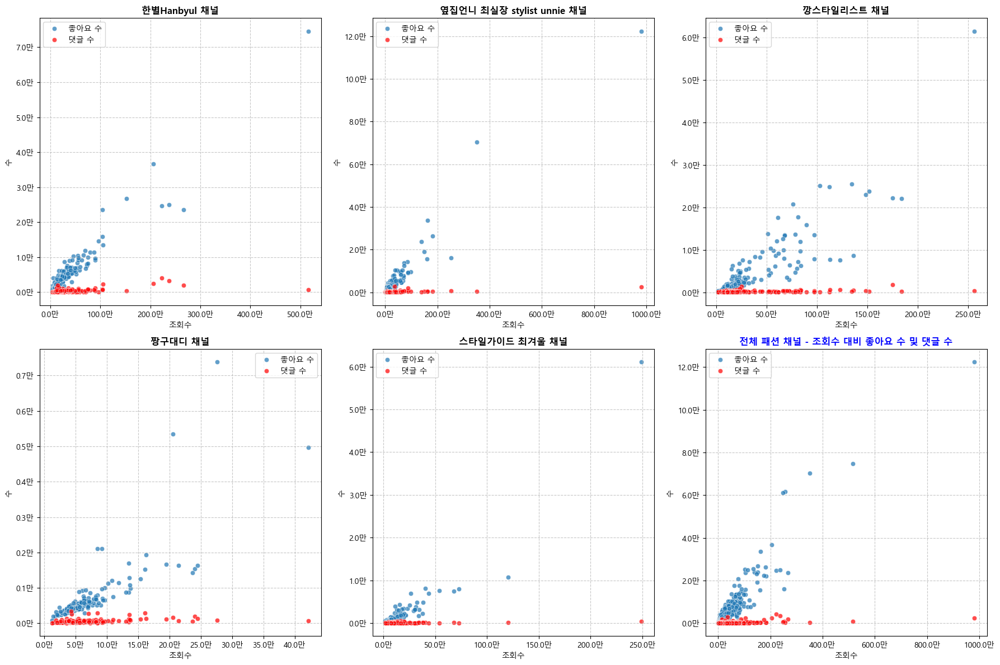

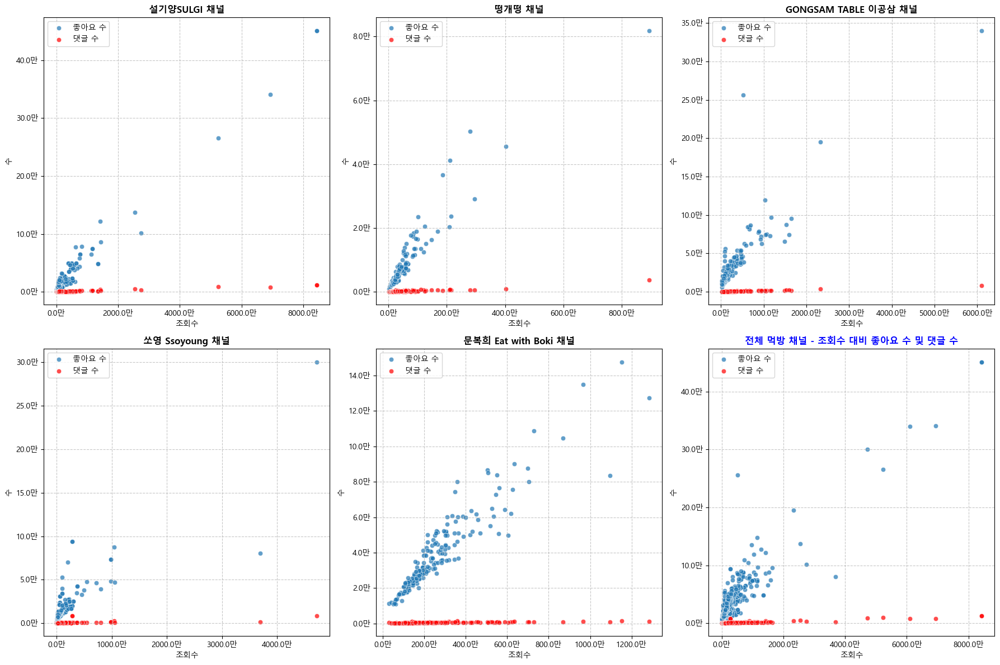

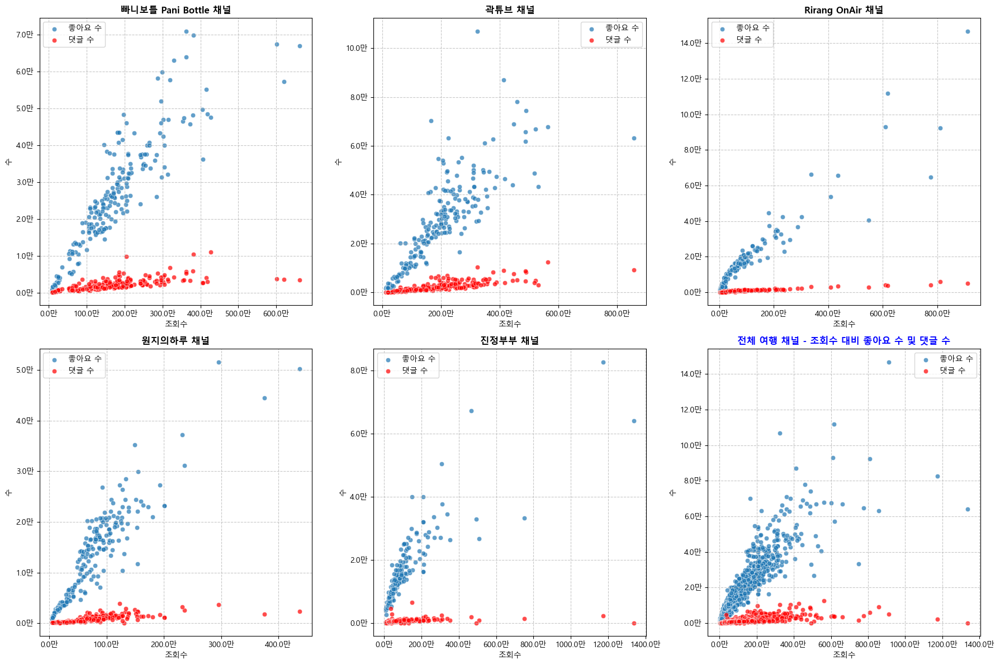

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
import os

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic' 
plt.rcParams['axes.unicode_minus'] = False  # 그래프에서 마이너스 기호 깨지는 문제 해결

# 데이터 파일 경로 설정
file_paths = [
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv",
]

# 모든 파일의 데이터를 읽어와서 하나의 DataFrame으로 결합
dfs = []
for file_path in file_paths:
    try:
        df = pd.read_csv(file_path)
        
        # Remove commas and convert columns to numeric
        for col in ['조회수', '좋아요 수', '댓글 수', '동영상 수']:
            if col in df.columns:
                df[col] = df[col].astype(str).str.replace(',', '')
                df[col] = pd.to_numeric(df[col], errors='coerce').fillna(0).astype(int)
        
        # Separate data based on file path
        df['파일경로'] = os.path.basename(file_path)
        dfs.append(df)
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")

# Combine all data frames into one
df_combined = pd.concat(dfs, ignore_index=True)

# 숫자를 만 단위로 포맷팅하는 함수
def format_compact_numbers(x, _):
    return f'{x / 10_000:.1f}만'

# 조회수, 좋아요 수 및 댓글 수를 시각화하는 함수
def plot_numbers(data, ax, title, title_color='black'):
    if data.empty:
        ax.axis('off')
        return
    
    sns.scatterplot(data=data, x='조회수', y='좋아요 수', alpha=0.7, label='좋아요 수', ax=ax)
    sns.scatterplot(data=data, x='조회수', y='댓글 수', alpha=0.7, label='댓글 수', color='red', ax=ax)
    
    ax.set_title(title, fontsize=12, weight='bold', color=title_color)
    ax.set_xlabel('조회수', fontsize=10)
    ax.set_ylabel('수', fontsize=10)
    ax.xaxis.set_major_formatter(FuncFormatter(format_compact_numbers))
    ax.yaxis.set_major_formatter(FuncFormatter(format_compact_numbers))
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)

def plot_category_analysis(df, category_name, file_keyword):
    category_data = df[df['파일경로'].str.contains(file_keyword, case=False)].copy()
    channels = category_data['채널명'].unique()
    num_channels = len(channels)
    
    # Subplot 설정
    num_rows = (num_channels // 3) + 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(18, 6 * num_rows))
    axes = axes.flatten()
    
    # 각 채널에 대한 시각화
    for i, channel in enumerate(channels):
        channel_data = category_data[category_data['채널명'] == channel].copy()
        plot_numbers(channel_data, axes[i], f'{channel} 채널')

    # 전체 채널 시각화 추가
    plot_numbers(category_data, axes[len(channels)], f'전체 {category_name} 채널 - 조회수 대비 좋아요 수 및 댓글 수', title_color='blue')

    # 남은 서브플롯 숨기기 (채널 수가 3의 배수가 아닐 경우)
    for j in range(len(channels) + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# 각 카테고리별 시각화 (순서: 패션, 먹방, 여행)
plot_category_analysis(df_combined, '패션', 'fashion')
plot_category_analysis(df_combined, '먹방', 'mukbang')
plot_category_analysis(df_combined, '여행', 'travel')


# 5. 각 분야별 & 채널별 재생시간, 총 조회수 분포 파악으로 조회수대비 상위 10개 하위 10개 재생시간 비교
# 5. Video Duration Analysis - Comparing Top 10 vs Bottom 10 Video Durations by Views Distribution
## -> 각 분야별 재생시간이 길수록 조회수가 낮을까? (영상길이가 길수록 사람들은 피로감을 느낀다)
## -> Do longer videos get fewer views in each category? (Longer videos may cause viewer fatigue)


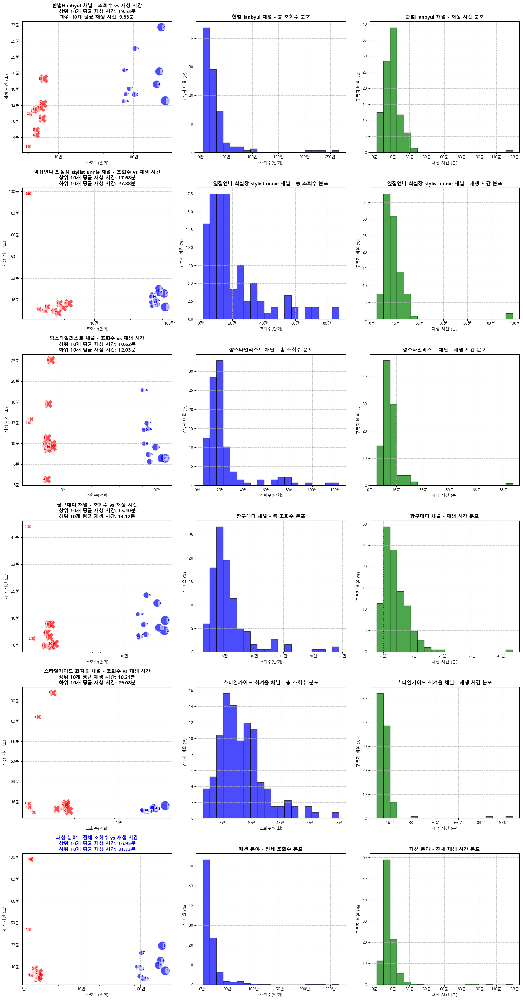

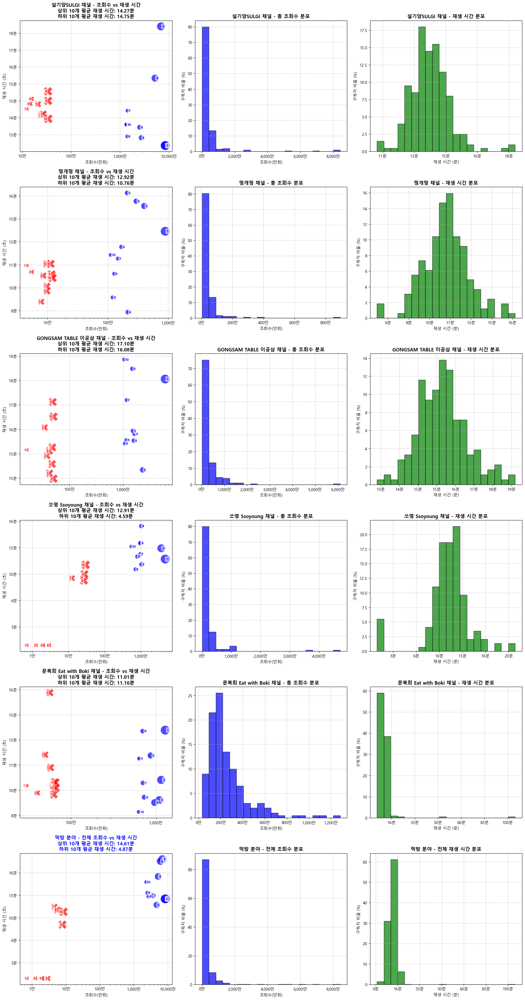

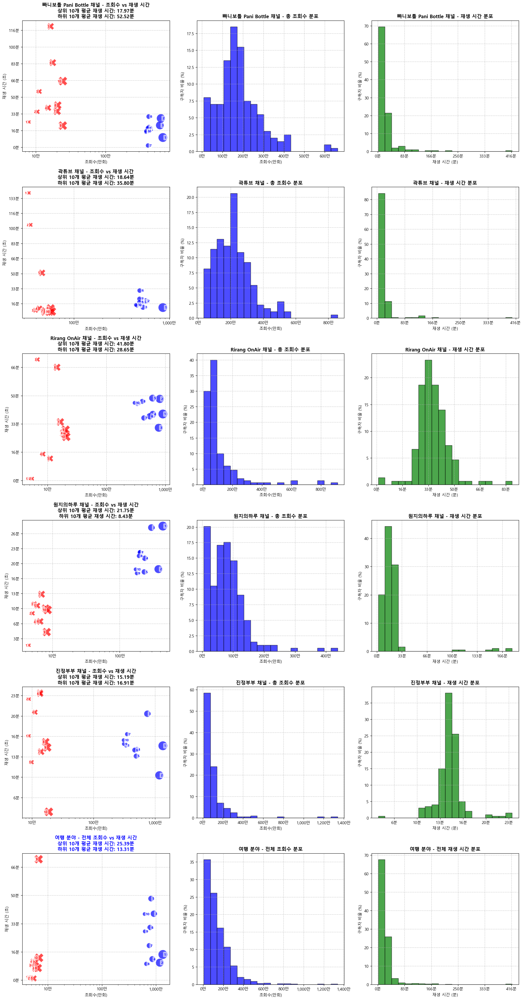

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
import numpy as np
import os

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False  # 그래프에서 마이너스 기호 깨지는 문제 해결

# 데이터 파일 경로 설정
file_paths = [
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv",
]

# 데이터 읽기 및 처리
dfs = []
for file_path in file_paths:
    try:
        df = pd.read_csv(file_path)
        
        # 쉼표 제거 및 숫자로 변환
        for col in ['조회수', '좋아요 수', '댓글 수', '동영상 수']:
            if col in df.columns:
                df[col] = df[col].astype(str).str.replace(',', '')
                df[col] = pd.to_numeric(df[col], errors='coerce').fillna(0).astype(int)
        
        # 파일 경로 정보 추가
        df['파일경로'] = os.path.basename(file_path)
        dfs.append(df)
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")

# 모든 데이터프레임을 하나로 결합
df_combined = pd.concat(dfs, ignore_index=True)

# Shorts 영상 제거 (재생 시간이 60초 이하인 비디오 제외)
df_combined = df_combined[df_combined['재생 시간 (초)'] > 60]

# 조회수와 재생 시간 비교 시각화 함수
def plot_playback_vs_views(data, ax, title, title_color='black'):
    """조회수와 재생 시간 비교 시각화"""
    # 상위 10개, 하위 10개 조회수 추출
    top_10 = data.nlargest(10, '조회수')
    bottom_10 = data.nsmallest(10, '조회수')

    # 평균 재생 시간 계산
    top_10_avg_length = top_10['재생 시간 (초)'].mean() / 60  # 평균 재생 시간 (분 단위)
    bottom_10_avg_length = bottom_10['재생 시간 (초)'].mean() / 60  # 평균 재생 시간 (분 단위)
    
    # Scatter plot 시각화
    sns.scatterplot(data=top_10, x='조회수', y='재생 시간 (초)', 
                    size='조회수', sizes=(100, 500), color='blue', alpha=0.7, marker='o', ax=ax, legend=None)
    sns.scatterplot(data=bottom_10, x='조회수', y='재생 시간 (초)', 
                    size='조회수', sizes=(100, 500), color='red', alpha=0.7, marker='X', ax=ax, legend=None)
    
    # 상위 10개 비디오의 순위 추가
    for rank, (index, row) in enumerate(top_10.iterrows(), start=1):
        ax.text(row['조회수'] * 1.05, row['재생 시간 (초)'], 
                f'{rank}', color='blue', fontsize=8, ha='left', va='center', fontweight='bold', 
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.3'))
    
    # 하위 10개 비디오의 순위 추가
    for rank, (index, row) in enumerate(bottom_10.iterrows(), start=1):
        ax.text(row['조회수'] * 0.95, row['재생 시간 (초)'], 
                f'{rank}', color='red', fontsize=8, ha='right', va='center', fontweight='bold', 
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.3'))
    
    ax.set_xscale('log')
    ax.set_title(f"{title}\n상위 10개 평균 재생 시간: {top_10_avg_length:.2f}분\n하위 10개 평균 재생 시간: {bottom_10_avg_length:.2f}분", 
                 fontsize=12, weight='bold', color=title_color)
    ax.set_xlabel('조회수(만회)', fontsize=10)
    ax.set_ylabel('재생 시간 (초)', fontsize=10)
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x / 10000):,}만'))  # x축 포맷
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x / 60):,}분'))  # y축 포맷 (분 단위로 포맷)
    ax.grid(True, linestyle='--', alpha=0.7)

# 분포 시각화 함수
def plot_distribution(data, ax, column, color, title, x_label, y_label):
    """분포 시각화"""
    total = len(data)
    
    # 히스토그램 및 퍼센트 계산
    hist_data, bin_edges = np.histogram(data[column], bins=20)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    percentages = (hist_data / total) * 100
    
    # 퍼센트가 100%를 초과하지 않도록 보정
    percentages = np.clip(percentages, 0, 100)
    
    ax.bar(bin_centers, percentages, width=np.diff(bin_edges), color=color, edgecolor='black', alpha=0.7)
    ax.set_title(title, fontsize=12, weight='bold', color='black')
    ax.set_xlabel(x_label, fontsize=10)
    ax.set_ylabel(y_label, fontsize=10)
    
    # x축 레이블을 만 단위로 포맷팅
    if column == '조회수':
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x / 10000):,}만'))
    elif column == '재생 시간 (초)':
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x / 60):,}분'))  # x축 레이블을 분 단위로 포맷팅
    
    ax.grid(True, linestyle='--', alpha=0.7)

# 분야별 시각화 설정
fields = {
    '패션': 'youtube_fashion_data.csv',
    '먹방': 'youtube_mukbang_data.csv',
    '여행': 'youtube_travel_data.csv'
}

for field, file_name in fields.items():
    field_data = df_combined[df_combined['파일경로'].str.contains(file_name, case=False)]
    
    if field_data.empty:
        print(f"{field} 분야에 대한 데이터가 없습니다.")
        continue

    channels = field_data['채널명'].unique()

    # 채널별 시각화 설정
    num_channels = len(channels)
    fig, axes = plt.subplots(nrows=num_channels + 1, ncols=3, figsize=(18, 6 * (num_channels + 1)))
    axes = axes.flatten()

    for i, channel in enumerate(channels):
        channel_data = field_data[field_data['채널명'] == channel]
        
        # 조회수 vs 재생 시간 시각화
        plot_playback_vs_views(channel_data, axes[i * 3], f'{channel} 채널 - 조회수 vs 재생 시간', title_color='black')
        
        # 총 조회수 분포 시각화
        plot_distribution(channel_data, axes[i * 3 + 1], '조회수', 'blue', f'{channel} 채널 - 총 조회수 분포', '조회수(만회)', '구독자 비율 (%)')
        
        # 재생 시간 분포 시각화
        plot_distribution(channel_data, axes[i * 3 + 2], '재생 시간 (초)', 'green', f'{channel} 채널 - 재생 시간 분포', '재생 시간 (분)', '구독자 비율 (%)')

    # 전체 분야에 대한 시각화 추가
    if num_channels * 3 < len(axes):
        field_summary_axes = axes[num_channels * 3:]
        if len(field_summary_axes) > 0:
            plot_playback_vs_views(field_data, field_summary_axes[0], f'{field} 분야 - 전체 조회수 vs 재생 시간', title_color='blue')
            plot_distribution(field_data, field_summary_axes[1], '조회수', 'blue', f'{field} 분야 - 전체 조회수 분포', '조회수(만회)', '구독자 비율 (%)')
            plot_distribution(field_data, field_summary_axes[2], '재생 시간 (초)', 'green', f'{field} 분야 - 전체 재생 시간 분포', '재생 시간 (분)', '구독자 비율 (%)')

    # 사용하지 않는 서브플롯 숨기기
    for j in range(num_channels * 3 + 3, len(axes)):
        axes[j].axis('off')

    # 레이아웃 조정
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # 여백 조정
    plt.show()


# 6. 각 분야별 - 채널별 채널 개설일에 따른 총 구독자수 및 총 조회수 비교
# 6. Channel Age Analysis - Total Subscribers and Views Comparison by Channel Creation Date
### -> 채널 개설일이 오래되었다고 총 구독자수 및 총 조회수가 높은것이 아니다.
### -> Older channels don't necessarily have higher subscriber counts and total views.


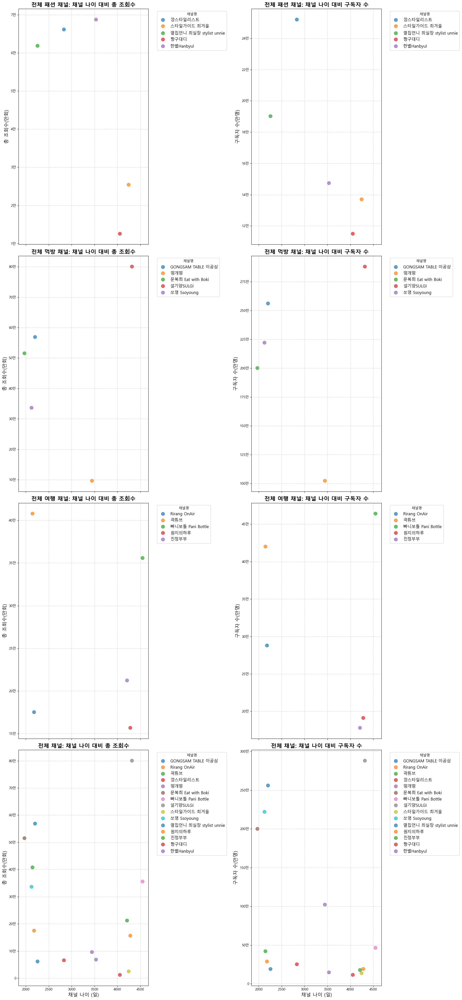

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
import os

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  

# 그래프에서 마이너스 기호 깨지는 문제 해결
plt.rcParams['axes.unicode_minus'] = False

# 데이터 파일 경로 설정
file_paths = [
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv",
]

# 데이터 읽기 및 처리
dfs = []
file_names = []

for file_path in file_paths:
    df = pd.read_csv(file_path)
    
    # 쉼표 제거 및 숫자로 변환
    df['조회수'] = df['조회수'].astype(str).str.replace(',', '')
    df['좋아요 수'] = df['좋아요 수'].astype(str).str.replace(',', '')
    df['댓글 수'] = df['댓글 수'].astype(str).str.replace(',', '')
    df['동영상 수'] = df['동영상 수'].astype(str).str.replace(',', '')

    df['조회수'] = pd.to_numeric(df['조회수'], errors='coerce').fillna(0).astype(int)
    df['좋아요 수'] = pd.to_numeric(df['좋아요 수'], errors='coerce').fillna(0).astype(int)
    df['댓글 수'] = pd.to_numeric(df['댓글 수'], errors='coerce').fillna(0).astype(int)
    df['동영상 수'] = pd.to_numeric(df['동영상 수'], errors='coerce').fillna(0).astype(int)

    # 파일 경로 정보 추가
    df['파일경로'] = os.path.basename(file_path)
    
    dfs.append(df)
    file_names.append(os.path.basename(file_path))

# 모든 데이터프레임을 하나로 결합
df_combined = pd.concat(dfs, ignore_index=True)

# 채널 개설일을 datetime으로 변환하고 시간대 정보 제거
df_combined['채널 개설일'] = pd.to_datetime(df_combined['채널 개설일'], errors='coerce')
df_combined['채널 개설일'] = df_combined['채널 개설일'].dt.tz_localize(None)

# 채널 나이 계산
today = pd.to_datetime('today').normalize()  # Normalize to remove any time component
df_combined['채널 나이'] = (today - df_combined['채널 개설일']).dt.days

# 채널과 채널 나이별 총 조회수와 구독자 수 집계
df_aggregated_combined = df_combined.groupby(['채널명', '채널 나이']).agg(
    {'조회수': 'sum', '구독자 수': 'sum'}).reset_index()

# 큰 숫자를 만 단위로 포맷팅하는 함수 (소수점 제거)
def format_korean_numbers(x, _):
    if x >= 10_000_000:
        return f'{x / 10_000_000:.0f}만'
    elif x >= 10_000:
        return f'{x / 10_000:.0f}만'
    elif x >= 1_000:
        return f'{x / 1_000:.0f}천'
    else:
        return f'{int(x)}'

# 서브플롯 설정
num_files = len(file_paths)
fig, axes = plt.subplots(num_files + 1, 2, figsize=(22, 10 * (num_files + 1)), sharex='col')

# 전체 채널의 총 조회수 vs 채널 나이 플로팅
sns.scatterplot(
    x='채널 나이', y='조회수', hue='채널명', data=df_aggregated_combined, palette='tab10', ax=axes[num_files, 0],
    alpha=0.7, s=100, edgecolor=None
)
axes[num_files, 0].set_title('전체 채널: 채널 나이 대비 총 조회수', fontsize=16, weight='bold')
axes[num_files, 0].set_xlabel('채널 나이 (일)', fontsize=14)
axes[num_files, 0].set_ylabel('총 조회수(만회)', fontsize=14)
axes[num_files, 0].yaxis.set_major_formatter(FuncFormatter(format_korean_numbers))
axes[num_files, 0].legend(title='채널명', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
axes[num_files, 0].grid(True, linestyle='--', alpha=0.6)

# 전체 채널의 구독자 수 vs 채널 나이 플로팅
sns.scatterplot(
    x='채널 나이', y='구독자 수', hue='채널명', data=df_aggregated_combined, palette='tab10', ax=axes[num_files, 1],
    alpha=0.7, s=100, edgecolor=None
)
axes[num_files, 1].set_title('전체 채널: 채널 나이 대비 구독자 수', fontsize=16, weight='bold')
axes[num_files, 1].set_xlabel('채널 나이 (일)', fontsize=14)
axes[num_files, 1].set_ylabel('구독자 수(만명)', fontsize=14)
axes[num_files, 1].yaxis.set_major_formatter(FuncFormatter(format_korean_numbers))
axes[num_files, 1].legend(title='채널명', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
axes[num_files, 1].grid(True, linestyle='--', alpha=0.6)

# 각 파일별 데이터 시각화
for i, (file_path, file_name) in enumerate(zip(file_paths, file_names)):
    df = dfs[i]
    df['채널 개설일'] = pd.to_datetime(df['채널 개설일'], errors='coerce')
    df['채널 개설일'] = df['채널 개설일'].dt.tz_localize(None)
    df['채널 나이'] = (today - df['채널 개설일']).dt.days
    
    df_aggregated = df.groupby(['채널명', '채널 나이']).agg(
        {'조회수': 'sum', '구독자 수': 'sum'}).reset_index()
    
    # 총 조회수 vs 채널 나이 플로팅
    sns.scatterplot(
        x='채널 나이', y='조회수', hue='채널명', data=df_aggregated, palette='tab10', ax=axes[i, 0],
        alpha=0.7, s=100, edgecolor=None
    )
    # 파일 이름에 따른 제목 설정
    if 'fashion' in file_name.lower():
        title = '전체 패션 채널: 채널 나이 대비 총 조회수'
    elif 'mukbang' in file_name.lower():
        title = '전체 먹방 채널: 채널 나이 대비 총 조회수'
    elif 'travel' in file_name.lower():
        title = '전체 여행 채널: 채널 나이 대비 총 조회수'
    else:
        title = f'{file_name} 채널: 채널 나이 대비 총 조회수'
    
    axes[i, 0].set_title(title, fontsize=16, weight='bold')
    axes[i, 0].set_xlabel('채널 나이 (일)', fontsize=14)
    axes[i, 0].set_ylabel('총 조회수(만회)', fontsize=14)
    axes[i, 0].yaxis.set_major_formatter(FuncFormatter(format_korean_numbers))
    axes[i, 0].legend(title='채널명', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    axes[i, 0].grid(True, linestyle='--', alpha=0.6)
    
    # 구독자 수 vs 채널 나이 플로팅
    sns.scatterplot(
        x='채널 나이', y='구독자 수', hue='채널명', data=df_aggregated, palette='tab10', ax=axes[i, 1],
        alpha=0.7, s=100, edgecolor=None
    )
    # 파일 이름에 따른 제목 설정
    if 'fashion' in file_name.lower():
        title = '전체 패션 채널: 채널 나이 대비 구독자 수'
    elif 'mukbang' in file_name.lower():
        title = '전체 먹방 채널: 채널 나이 대비 구독자 수'
    elif 'travel' in file_name.lower():
        title = '전체 여행 채널: 채널 나이 대비 구독자 수'
    else:
        title = f'{file_name} 채널: 채널 나이 대비 구독자 수'
    
    axes[i, 1].set_title(title, fontsize=16, weight='bold')
    axes[i, 1].set_xlabel('채널 나이 (일)', fontsize=14)
    axes[i, 1].set_ylabel('구독자 수(만명)', fontsize=14)
    axes[i, 1].yaxis.set_major_formatter(FuncFormatter(format_korean_numbers))
    axes[i, 1].legend(title='채널명', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    axes[i, 1].grid(True, linestyle='--', alpha=0.6)

# 남은 서브플롯 숨기기
for j in range(num_files + 1, len(axes)):
    for k in range(2):
        axes[j, k].axis('off')

# 서브플롯 레이아웃 조정
plt.tight_layout(rect=[0, 0, 0.85, 1])  # 여백 조정

# 플롯 표시
plt.show()


In [89]:
import pandas as pd
import re
import matplotlib.pyplot as plt

# 그래프에 한글을 표시하도록 설정
plt.rcParams['font.family'] = 'Malgun Gothic'

# 그래프에서 마이너스 기호 깨지는 문제 해결
plt.rcParams['axes.unicode_minus'] = False

# 데이터 파일 경로 설정
file_paths = [
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv",
    r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv",
]

# 데이터 로드 함수
def load_data(file_paths):
    data = {}
    for file_path in file_paths:
        category_name = file_path.split('\\')[-1].split('_')[1]  # 파일명에서 카테고리 추출
        data[category_name] = pd.read_csv(file_path)
    return data

# 데이터 전처리
def preprocess_youtube_data(youtube_data):
    
    # 필터링 및 데이터 변환
    youtube_data = youtube_data[youtube_data['재생 시간 (초)'] >= 70].reset_index(drop=True)
    
    # 숫자 데이터 변환
    youtube_data['조회수'] = youtube_data['조회수'].astype(str).str.replace(',', '')
    youtube_data['좋아요 수'] = youtube_data['좋아요 수'].astype(str).str.replace(',', '')
    youtube_data['댓글 수'] = youtube_data['댓글 수'].astype(str).str.replace(',', '')
    
    youtube_data['조회수'] = pd.to_numeric(youtube_data['조회수'], errors='coerce')
    youtube_data['좋아요 수'] = pd.to_numeric(youtube_data['좋아요 수'], errors='coerce')
    youtube_data['댓글 수'] = pd.to_numeric(youtube_data['댓글 수'], errors='coerce')
    
    # 중복 제거
    youtube_data = youtube_data.drop_duplicates(subset=['제목', '채널명']).reset_index(drop=True)
    
    # 채널 개설일 대비 구독자 수 및 총 조회수 분석
    youtube_data['채널 개설일'] = pd.to_datetime(youtube_data['채널 개설일'], errors='coerce')
    youtube_data['채널 개설일'] = youtube_data['채널 개설일'].dt.tz_localize(None)
    
    # 쇼츠 영상 제거 (비디오 길이가 60초 이하인 비디오 제외)
play_time_col = '재생 시간(분)'  # 실제 열 이름에 맞게 조정
if play_time_col in df.columns:
    df = df[df[play_time_col] > 60]
else:
    print(f"DataFrame에서 '{play_time_col}' 열을 찾을 수 없습니다.")

    # 기대 (평균)조회수 계산 (총,최근 200개)
    youtube_data['영상별_기대조회수'] = youtube_data['총 조회수'] / youtube_data['동영상 수']
    
    youtube_data['최근_200개_영상수'] = youtube_data.groupby('채널명')['채널명'].transform('size')
    youtube_data['최근_200개_조회수'] = youtube_data.groupby('채널명')['조회수'].transform('sum')
    youtube_data['최근_200개_기대조회수'] = youtube_data['최근_200개_조회수'] / youtube_data['최근_200개_영상수']
    
    # 각각의 영상별에다가 기대조회수 충족여부 및 최근 200개 기대조회수 충족여부 계산
    youtube_data['영상별_기대조회수_충족여부'] = youtube_data.apply(lambda row: 'O' if row['조회수'] >= row['영상별_기대조회수'] else 'X', axis=1)
    
    youtube_data['최근200개_기대조회수_충족여부'] = youtube_data.apply(lambda row: 'O' if row['조회수'] >= row['최근_200개_기대조회수'] else 'X', axis=1)

    return youtube_data

# 중복 제거 및 각 채널별 최근 200개 영상 관련 데이터 계산 함수
def preprocess_youtube_data_legacy(youtube_data):
    # 중복 제거
    youtube_data = youtube_data.drop_duplicates(subset=['제목', '채널명']).copy()
    
    # 각 채널별로 남아있는 영상 개수를 계산하여 새로운 열에 저장
    youtube_data['최근_200개_영상수'] = youtube_data.groupby('채널명')['채널명'].transform('size')
    youtube_data['최근_200개_조회수'] = youtube_data.groupby('채널명')['조회수'].transform('sum')
    youtube_data['최근_200개_기대조회수'] = youtube_data['최근_200개_조회수'] / youtube_data['최근_200개_영상수']
    
    return youtube_data

# 7. 각 분야 별 & 분야별 - 채널별 기대조회수 충족 여부 파악
# 7. Expected Views Analysis - Performance Against Expected View Counts by Category and Channel
    총 채널영상 기대조회수 = 총 조회수 / 총 동영상수
    
    최근 영상 기대조회수 = 전처리후 최근 200개의 동영상 내에 남은 영상의 총 조회수 / 최근 200개의 남은 영상 수

## -> 각 채널 별 전체 동영상의 기대조회수 기준으로 최근 200개 기대조회수 파악
## -> Analyzing recent 200 videos' expected views based on each channel's overall expected view count
## 채널별로 미래 동향 및 발전 방향 제시
## -> Providing future trends and development directions for each channel

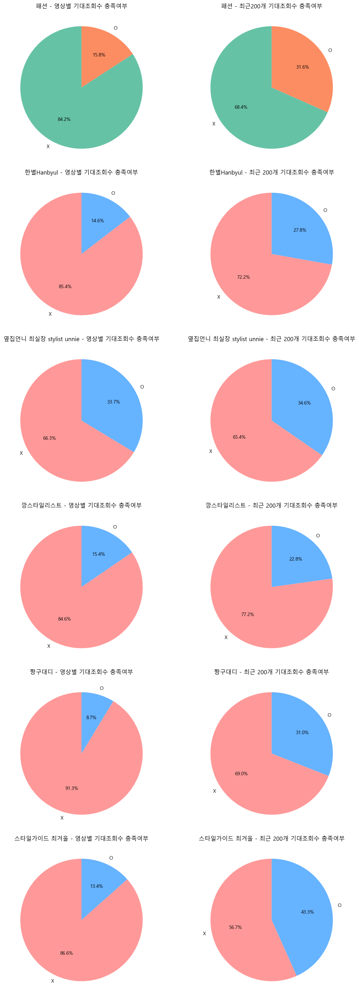

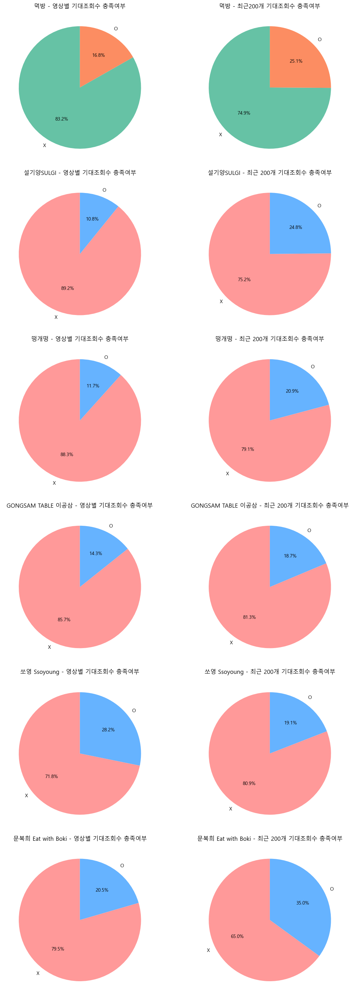

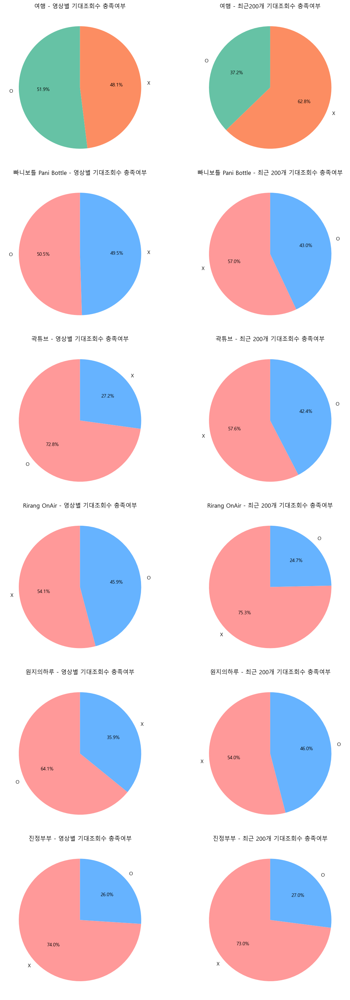

In [90]:
# 카테고리 및 채널별 플롯 함수
def plot_category_and_channels(youtube_data, category_name):
    channels = youtube_data['채널명'].unique()
    num_channels = len(channels)
    
    # 서브플롯이 포함된 그림 생성
    fig, axes = plt.subplots(num_channels + 1, 2, figsize=(12, 5 * (num_channels + 1)))
    
    # 카테고리별 전체 파이 차트
    compliance_counts = youtube_data[['영상별_기대조회수_충족여부', '최근200개_기대조회수_충족여부']].apply(pd.Series.value_counts).T
    if '영상별_기대조회수_충족여부' in compliance_counts.index and '최근200개_기대조회수_충족여부' in compliance_counts.index:
        axes[0, 0].pie(compliance_counts.loc['영상별_기대조회수_충족여부'], 
                       labels=compliance_counts.loc['영상별_기대조회수_충족여부'].index, 
                       autopct='%1.1f%%', startangle=90, 
                       colors=['#66c2a5', '#fc8d62'])
        axes[0, 0].set_title(f'{category_name} - 영상별 기대조회수 충족여부')

        axes[0, 1].pie(compliance_counts.loc['최근200개_기대조회수_충족여부'], 
                       labels=compliance_counts.loc['최근200개_기대조회수_충족여부'].index, 
                       autopct='%1.1f%%', startangle=90, 
                       colors=['#66c2a5', '#fc8d62'])
        axes[0, 1].set_title(f'{category_name} - 최근200개 기대조회수 충족여부')
    else:
        print("필요한 컬럼이 데이터에 없습니다")

    # 채널별 파이 차트
    for i, channel in enumerate(channels):
        channel_data = youtube_data[youtube_data['채널명'] == channel]
        
        # 영상별 기대 조회수 충족 여부 플로팅
        plot_pie_chart(channel_data['영상별_기대조회수_충족여부'], f'{channel} - 영상별 기대조회수 충족여부', ax=axes[i + 1, 0])
        
        # 최근 200개 영상의 기대 조회수 충족 여부 플로팅
        plot_pie_chart(channel_data['최근200개_기대조회수_충족여부'], f'{channel} - 최근 200개 기대조회수 충족여부', ax=axes[i + 1, 1])
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# 데이터 로드
data = load_data(file_paths)

# 데이터 전처리
youtube_fashion = preprocess_youtube_data(data.get('fashion', pd.DataFrame()))
youtube_mukbang = preprocess_youtube_data(data.get('mukbang', pd.DataFrame()))
youtube_travel = preprocess_youtube_data(data.get('travel', pd.DataFrame()))

# 카테고리별로 플롯 함수 호출 (패션, 먹방, 여행 순서로)
plot_category_and_channels(youtube_fashion, '패션')
plot_category_and_channels(youtube_mukbang, '먹방')
plot_category_and_channels(youtube_travel, '여행')


# 8. 각 분야별 총 조회수 및 총 구독자수 비율 비교 및 분석
# 8. Subscriber Ratio Analysis - Views to Subscriber Ratio Comparison and Analysis by Category
## -> 구독자수 대비 조회수 비교 > 각 분야 채널별 유튜브 현동향 및 미래 발전 방향 제시
## -> Comparing views per subscriber > Presenting current YouTube trends and future development directions for channels in each category



패션 채널 데이터

+-------------------------------+-------------+----------------+----------+-------------+-------------+-------------------------------------------------------------------------------+
| 채널명                        |   총_조회수 |   총_구독자_수 |     비율 |   평균_비율 |   비율_차이 | 조언                                                                          |
+===============================+=============+================+==========+=============+=============+===============================================================================+
| 깡스타일리스트                |    66156216 |      252000000 | 0.262525 |    0.278946 |  -0.0164213 | 깡스타일리스트 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다.      |
+-------------------------------+-------------+----------------+----------+-------------+-------------+-------------------------------------------------------------------------------+
| 스타일가이드 최겨울           |    25411033 |      137000000 | 0.185482 |    0.278946 |  -0.093464  | 스타일가이드 최겨울 채널은 조회수를 증가시키기 위한 콘텐츠 제작이

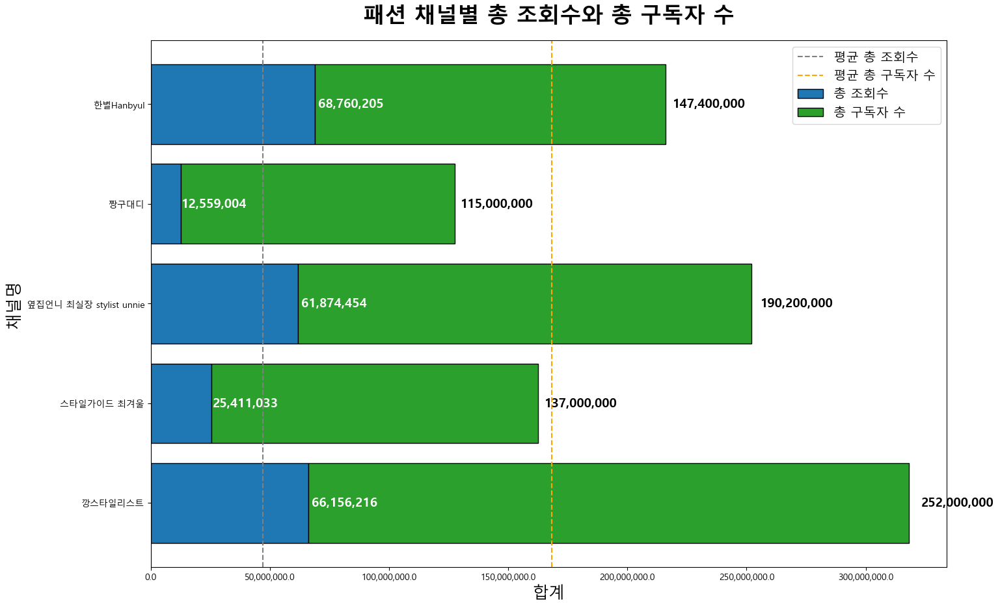

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from tabulate import tabulate

# 숫자를 천 단위로 포맷팅하는 함수
def format_exact(x, _):
    """숫자를 포맷팅하는 함수."""
    return f'{x:,}'

# 데이터를 시각화하는 함수
def plot_channel_data(df, channel_name, average_views, average_subscribers):
    channel_totals = df.groupby('채널명').agg(
        총_조회수=('조회수', 'sum'),
        총_구독자_수=('구독자 수', 'sum')
    ).reset_index()
    
    channel_totals['비율'] = channel_totals['총_조회수'] / channel_totals['총_구독자_수']
    avg_ratio = average_views / average_subscribers
    channel_totals['평균_비율'] = avg_ratio
    channel_totals['비율_차이'] = channel_totals['비율'] - channel_totals['평균_비율']
    
    def get_advice(row):
        """비율이 평균 이하인 경우 조언을 제공하는 함수."""
        if row['비율'] < row['평균_비율']:
            return f"{row['채널명']} 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다."
        else:
            return f"{row['채널명']} 채널의 비율은 평균 이상입니다."
    
    channel_totals['조언'] = channel_totals.apply(get_advice, axis=1)
    
    # 결과 출력
    print(f"\n{channel_name} 채널 데이터\n")
    print(tabulate(channel_totals[['채널명', '총_조회수', '총_구독자_수', '비율', '평균_비율', '비율_차이', '조언']], headers='keys', tablefmt='grid', showindex=False))
    
    # 그래프 시각화
    fig, ax = plt.subplots(figsize=(16, 10))  # 그래프 크기 조정

    bars = ax.barh(channel_totals['채널명'], channel_totals['총_조회수'], color='#1f77b4', edgecolor='black', label='총 조회수')
    bars_sub = ax.barh(channel_totals['채널명'], channel_totals['총_구독자_수'], left=channel_totals['총_조회수'], color='#2ca02c', edgecolor='black', label='총 구독자 수')

    ax.axvline(average_views, color='gray', linestyle='--', label='평균 총 조회수')
    ax.axvline(average_subscribers, color='orange', linestyle='--', label='평균 총 구독자 수')

    ax.set_title(f'{channel_name} 채널별 총 조회수와 총 구독자 수', fontsize=24, weight='bold', pad=20)
    ax.set_xlabel('합계', fontsize=18)
    ax.set_ylabel('채널명', fontsize=18)

    ax.xaxis.set_major_formatter(FuncFormatter(format_exact))

    # 막대 끝에 숫자 표시하기
    for bar, bar_sub in zip(bars, bars_sub):
        width = bar.get_width()
        sub_width = bar_sub.get_width()

        # 막대 길이에 따라 텍스트 위치 조정
        if width > 0:
            ax.text(width + 0.02 * width, bar.get_y() + bar.get_height() / 2.0,
                    format_exact(width, None),
                    va='center', ha='left', fontsize=14, weight='bold', color='white')

        if sub_width > 0:
            ax.text(width + sub_width + 0.02 * sub_width, bar.get_y() + bar.get_height() / 2.0,
                    format_exact(sub_width, None),
                    va='center', ha='left', fontsize=14, weight='bold', color='black')  # 텍스트 색상 변경

    ax.legend(loc='upper right', fontsize=14)
    plt.tight_layout(pad=3.0)  # 패딩 조정
    plt.show()

# 패션 채널 데이터 로드 및 처리
fashion_file_path = r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv"
fashion_df = pd.read_csv(fashion_file_path)

# 쉼표 제거 및 숫자로 변환
fashion_df['조회수'] = fashion_df['조회수'].astype(str).str.replace(',', '')
fashion_df['좋아요 수'] = fashion_df['좋아요 수'].astype(str).str.replace(',', '')
fashion_df['댓글 수'] = fashion_df['댓글 수'].astype(str).str.replace(',', '')
fashion_df['동영상 수'] = fashion_df['동영상 수'].astype(str).str.replace(',', '')

fashion_df['조회수'] = pd.to_numeric(fashion_df['조회수'], errors='coerce').fillna(0).astype(int)
fashion_df['좋아요 수'] = pd.to_numeric(fashion_df['좋아요 수'], errors='coerce').fillna(0).astype(int)
fashion_df['댓글 수'] = pd.to_numeric(fashion_df['댓글 수'], errors='coerce').fillna(0).astype(int)
fashion_df['동영상 수'] = pd.to_numeric(fashion_df['동영상 수'], errors='coerce').fillna(0).astype(int)

# 총 조회수 및 구독자 수 계산
total_views_fashion = fashion_df['조회수'].sum()
total_subscribers_fashion = fashion_df['구독자 수'].sum()
num_channels_fashion = len(fashion_df['채널명'].unique())
avg_views_fashion = total_views_fashion / num_channels_fashion
avg_subscribers_fashion = total_subscribers_fashion / num_channels_fashion

plot_channel_data(fashion_df, '패션', avg_views_fashion, avg_subscribers_fashion)



패션 채널 데이터

+-------------------------------+-------------+----------------+---------+-------------+-------------+-----------------------------------------------------------------------------------------+
| 채널명                        |   총_조회수 |   총_구독자_수 |    비율 |   평균_비율 |   비율_차이 | 조언                                                                                    |
+===============================+=============+================+=========+=============+=============+=========================================================================================+
| 깡스타일리스트                |    66156216 |        1260000 | 52.5049 |     186.318 |   -133.813  | 깡스타일리스트 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다.                |
+-------------------------------+-------------+----------------+---------+-------------+-------------+-----------------------------------------------------------------------------------------+
| 스타일가이드 최겨울           |    25411033 |         685000 | 37.0964 |     186.318 |   -149

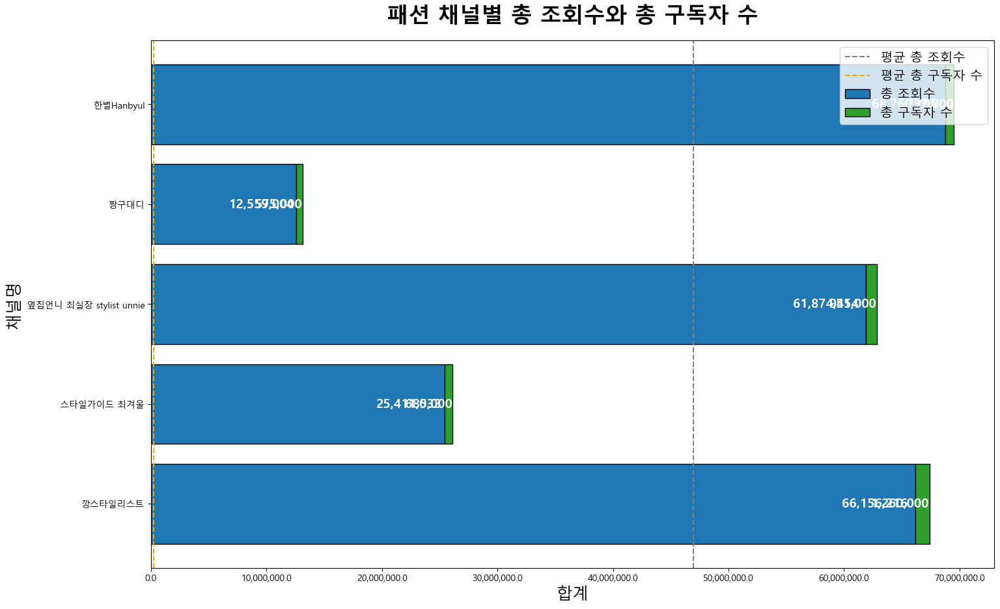

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from tabulate import tabulate

# Function to format numbers without scaling
def format_exact(x, _):
    """Format numbers without scaling."""
    return f'{x:,}'

# Plotting function
def plot_channel_data(df, channel_name, average_views, average_subscribers):
    # Ensure that subscriber count is accurate by taking the maximum for each channel
    channel_totals = df.groupby('채널명').agg(
        총_조회수=('조회수', 'sum'),
        총_구독자_수=('구독자 수', 'max')  # Take the max to avoid summing subscribers across multiple entries
    ).reset_index()
    
    channel_totals['비율'] = channel_totals['총_조회수'] / channel_totals['총_구독자_수']
    avg_ratio = average_views / average_subscribers
    channel_totals['평균_비율'] = avg_ratio
    channel_totals['비율_차이'] = channel_totals['비율'] - channel_totals['평균_비율']
    
    def get_advice(row):
        """Return advice if the ratio is below average."""
        if row['비율'] < row['평균_비율']:
            return f"{row['채널명']} 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다."
        else:
            return f"{row['채널명']} 채널의 비율은 평균 이상입니다."
    
    channel_totals['조언'] = channel_totals.apply(get_advice, axis=1)
    
    # Output results
    print(f"\n{channel_name} 채널 데이터\n")
    print(tabulate(channel_totals[['채널명', '총_조회수', '총_구독자_수', '비율', '평균_비율', '비율_차이', '조언']], headers='keys', tablefmt='grid', showindex=False))
    
    # Plotting
    fig, ax = plt.subplots(figsize=(16, 10))  # Increase the plot size

    bars = ax.barh(channel_totals['채널명'], channel_totals['총_조회수'], color='#1f77b4', edgecolor='black', label='총 조회수')
    bars_sub = ax.barh(channel_totals['채널명'], channel_totals['총_구독자_수'], left=channel_totals['총_조회수'], color='#2ca02c', edgecolor='black', label='총 구독자 수')

    ax.axvline(average_views, color='gray', linestyle='--', label='평균 총 조회수')
    ax.axvline(average_subscribers, color='orange', linestyle='--', label='평균 총 구독자 수')

    ax.set_title(f'{channel_name} 채널별 총 조회수와 총 구독자 수', fontsize=24, weight='bold', pad=20)
    ax.set_xlabel('합계', fontsize=18)
    ax.set_ylabel('채널명', fontsize=18)

    ax.xaxis.set_major_formatter(FuncFormatter(format_exact))

    for bar, bar_sub in zip(bars, bars_sub):
        width = bar.get_width()
        sub_width = bar_sub.get_width()

        ax.text(width - 0.01 * width, bar.get_y() + bar.get_height() / 2.0,
                format_exact(width, None),
                va='center', ha='right', fontsize=14, weight='bold', color='white')

        if sub_width > 0:
            ax.text(width + sub_width - 0.02 * sub_width, bar.get_y() + bar.get_height() / 2.0,
                    format_exact(sub_width, None),
                    va='center', ha='right', fontsize=14, weight='bold', color='white')

    ax.legend(loc='upper right', fontsize=14)
    plt.tight_layout(pad=3.0)  # Increase padding to avoid overlap
    plt.show()

# Load and process data for Fashion channel
fashion_file_path = r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_fashion_data.csv"
fashion_df = pd.read_csv(fashion_file_path)

# Remove commas and convert to numbers
fashion_df['조회수'] = fashion_df['조회수'].astype(str).str.replace(',', '')
fashion_df['좋아요 수'] = fashion_df['좋아요 수'].astype(str).str.replace(',', '')
fashion_df['댓글 수'] = fashion_df['댓글 수'].astype(str).str.replace(',', '')
fashion_df['동영상 수'] = fashion_df['동영상 수'].astype(str).str.replace(',', '')

fashion_df['조회수'] = pd.to_numeric(fashion_df['조회수'], errors='coerce').fillna(0).astype(int)
fashion_df['좋아요 수'] = pd.to_numeric(fashion_df['좋아요 수'], errors='coerce').fillna(0).astype(int)
fashion_df['댓글 수'] = pd.to_numeric(fashion_df['댓글 수'], errors='coerce').fillna(0).astype(int)
fashion_df['동영상 수'] = pd.to_numeric(fashion_df['동영상 수'], errors='coerce').fillna(0).astype(int)

# Calculate total views and subscribers
total_views_fashion = fashion_df['조회수'].sum()
total_subscribers_fashion = fashion_df['구독자 수'].max()
num_channels_fashion = len(fashion_df['채널명'].unique())
avg_views_fashion = total_views_fashion / num_channels_fashion
avg_subscribers_fashion = total_subscribers_fashion / num_channels_fashion

plot_channel_data(fashion_df, '패션', avg_views_fashion, avg_subscribers_fashion)



음식 채널 데이터

+----------------------+-------------+----------------+----------+-------------+-------------+-------------------------------------------------------------------------+
| 채널명               |   총_조회수 |   총_구독자_수 |     비율 |   평균_비율 |   비율_차이 | 조언                                                                    |
+======================+=============+================+==========+=============+=============+=========================================================================+
| GONGSAM TABLE 이공삼 |   568877233 |     2560000000 | 0.222218 |    0.216947 |  0.00527067 | GONGSAM TABLE 이공삼 채널의 비율은 평균 이상입니다.                     |
+----------------------+-------------+----------------+----------+-------------+-------------+-------------------------------------------------------------------------+
| 떵개떵               |    96488045 |     1022000000 | 0.094411 |    0.216947 | -0.122536   | 떵개떵 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다.        |
+----------------------+-------------+----------

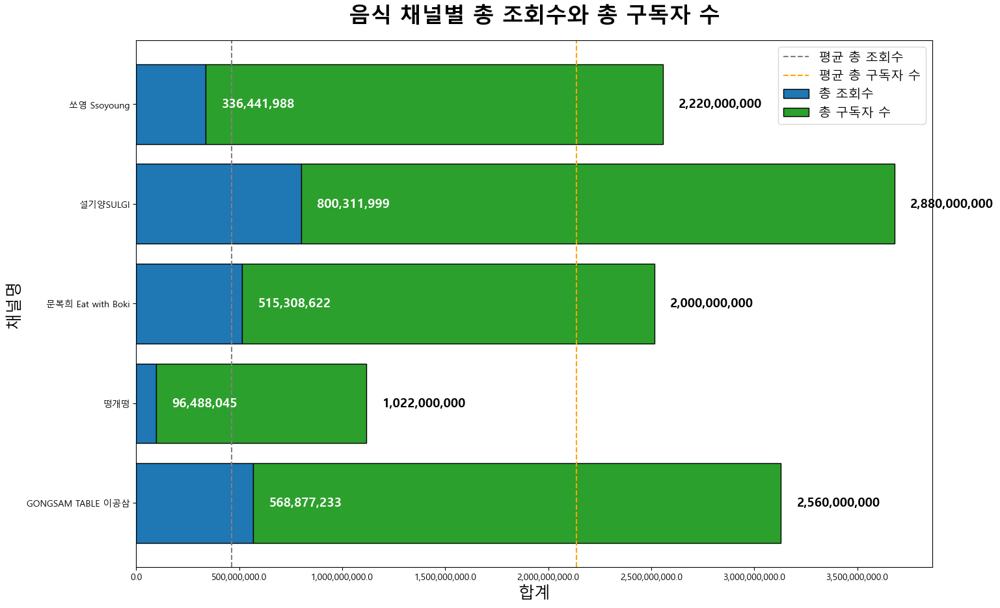

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from tabulate import tabulate
import os

# 숫자를 1000단위 콤마로 포맷하는 함수
def format_exact(x, _):
    """숫자를 1000단위 콤마로 포맷합니다."""
    return f'{x:,}'

# 그래프 그리기 함수
def plot_channel_data(df, channel_name, average_views, average_subscribers):
    channel_totals = df.groupby('채널명').agg(
        총_조회수=('조회수', 'sum'),
        총_구독자_수=('구독자 수', 'sum')
    ).reset_index()
    
    channel_totals['비율'] = channel_totals['총_조회수'] / channel_totals['총_구독자_수']
    avg_ratio = average_views / average_subscribers
    channel_totals['평균_비율'] = avg_ratio
    channel_totals['비율_차이'] = channel_totals['비율'] - channel_totals['평균_비율']
    
    # 비율에 따라 조언 생성
    def get_advice(row):
        """비율이 평균 이하일 경우 조언을 반환합니다."""
        if row['비율'] < row['평균_비율']:
            return f"{row['채널명']} 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다."
        else:
            return f"{row['채널명']} 채널의 비율은 평균 이상입니다."
    
    channel_totals['조언'] = channel_totals.apply(get_advice, axis=1)
    
    # 결과 표 출력
    print(f"\n{channel_name} 채널 데이터\n")
    print(tabulate(channel_totals[['채널명', '총_조회수', '총_구독자_수', '비율', '평균_비율', '비율_차이', '조언']], 
                   headers='keys', tablefmt='grid', showindex=False))
    
    # 그래프 그리기
    fig, ax = plt.subplots(figsize=(16, 10))  # 그래프 크기 조정

    bars = ax.barh(channel_totals['채널명'], channel_totals['총_조회수'], color='#1f77b4', edgecolor='black', label='총 조회수')
    bars_sub = ax.barh(channel_totals['채널명'], channel_totals['총_구독자_수'], left=channel_totals['총_조회수'], color='#2ca02c', edgecolor='black', label='총 구독자 수')

    ax.axvline(average_views, color='gray', linestyle='--', label='평균 총 조회수')
    ax.axvline(average_subscribers, color='orange', linestyle='--', label='평균 총 구독자 수')

    ax.set_title(f'{channel_name} 채널별 총 조회수와 총 구독자 수', fontsize=24, weight='bold', pad=20)
    ax.set_xlabel('합계', fontsize=18)
    ax.set_ylabel('채널명', fontsize=18)

    ax.xaxis.set_major_formatter(FuncFormatter(format_exact))

    for bar, bar_sub in zip(bars, bars_sub):
        width = bar.get_width()
        sub_width = bar_sub.get_width()

        # 막대의 크기와 상관없이 텍스트를 막대의 오른쪽 외부에 고정적으로 배치
        text_x_position = width + 0.02 * ax.get_xlim()[1]  # 막대의 오른쪽에 텍스트를 위치시킴
        ax.text(text_x_position, bar.get_y() + bar.get_height() / 2.0,
                format_exact(width, None),
                va='center', ha='left', fontsize=14, weight='bold', color='white')

        if sub_width > 0:
            text_sub_x_position = width + sub_width + 0.02 * ax.get_xlim()[1]
            ax.text(text_sub_x_position, bar.get_y() + bar.get_height() / 2.0,
                    format_exact(sub_width, None),
                    va='center', ha='left', fontsize=14, weight='bold', color='black')

    ax.legend(loc='upper right', fontsize=14)
    plt.tight_layout(pad=3.0)  # 패딩을 증가시켜 겹침 방지
    plt.show()

# 파일 경로
file_path = r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_mukbang_data.csv"

# 파일이 존재하는지 확인
if os.path.exists(file_path):
    try:
        df = pd.read_csv(file_path)
        
        # 콤마 제거 및 숫자 변환
        df['조회수'] = df['조회수'].astype(str).str.replace(',', '')
        df['좋아요 수'] = df['좋아요 수'].astype(str).str.replace(',', '')
        df['댓글 수'] = df['댓글 수'].astype(str).str.replace(',', '')
        df['동영상 수'] = df['동영상 수'].astype(str).str.replace(',', '')

        df['조회수'] = pd.to_numeric(df['조회수'], errors='coerce').fillna(0).astype(int)
        df['좋아요 수'] = pd.to_numeric(df['좋아요 수'], errors='coerce').fillna(0).astype(int)
        df['댓글 수'] = pd.to_numeric(df['댓글 수'], errors='coerce').fillna(0).astype(int)
        df['동영상 수'] = pd.to_numeric(df['동영상 수'], errors='coerce').fillna(0).astype(int)

        # 총 조회수 및 구독자 수 계산
        total_views = df['조회수'].sum()
        total_subscribers = df['구독자 수'].sum()
        num_channels = len(df['채널명'].unique())
        avg_views = total_views / num_channels
        avg_subscribers = total_subscribers / num_channels

        plot_channel_data(df, '음식', avg_views, avg_subscribers)

    except Exception as e:
        print(f"An error occurred: {e}")
else:
    print("파일이 존재하지 않습니다. 파일 경로를 확인하세요.")



여행 채널 데이터

+----------------------+-------------+----------------+----------+-------------+-------------+--------------------------------------------------------------------------------+
| 채널명               |   총_조회수 |   총_구독자_수 |     비율 |   평균_비율 |   비율_차이 | 조언                                                                           |
+======================+=============+================+==========+=============+=============+================================================================================+
| Rirang OnAir         |   175175939 |      288000000 | 0.60825  |    0.848717 |  -0.240468  | Rirang OnAir 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다.         |
+----------------------+-------------+----------------+----------+-------------+-------------+--------------------------------------------------------------------------------+
| 곽튜브               |   407852109 |      420000000 | 0.971076 |    0.848717 |   0.122359  | 곽튜브 채널의 비율은 평균 이상입니다.                                          |


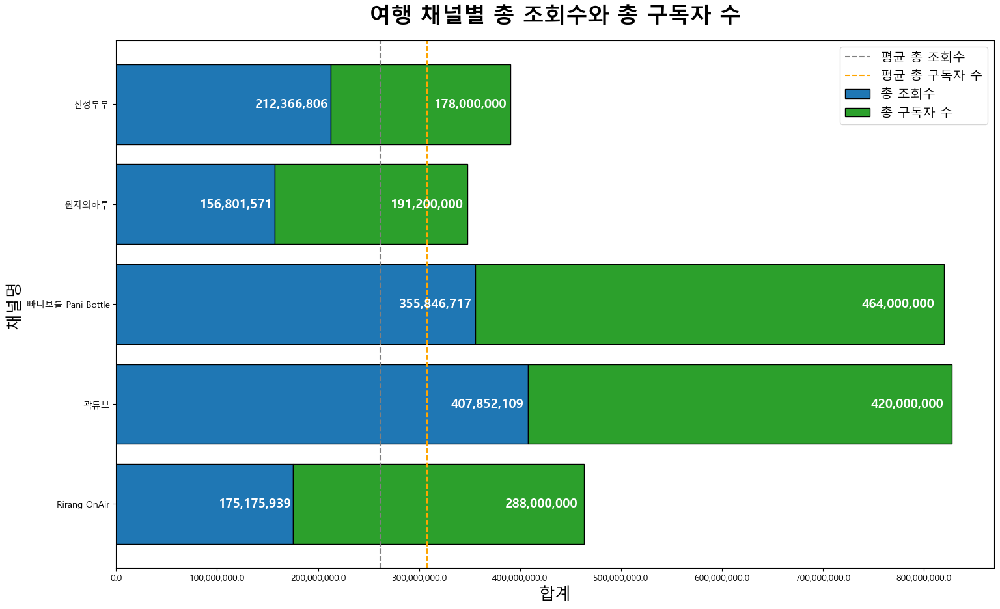

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from tabulate import tabulate

# Function to format numbers without scaling
def format_exact(x, _):
    """Format numbers without scaling."""
    return f'{x:,}'

# Plotting function
def plot_channel_data(df, channel_name, average_views, average_subscribers):
    channel_totals = df.groupby('채널명').agg(
        총_조회수=('조회수', 'sum'),
        총_구독자_수=('구독자 수', 'sum')
    ).reset_index()
    
    channel_totals['비율'] = channel_totals['총_조회수'] / channel_totals['총_구독자_수']
    avg_ratio = average_views / average_subscribers
    channel_totals['평균_비율'] = avg_ratio
    channel_totals['비율_차이'] = channel_totals['비율'] - channel_totals['평균_비율']
    
    def get_advice(row):
        """Return advice if the ratio is below average."""
        if row['비율'] < row['평균_비율']:
            return f"{row['채널명']} 채널은 조회수를 증가시키기 위한 콘텐츠 제작이 필요합니다."
        else:
            return f"{row['채널명']} 채널의 비율은 평균 이상입니다."
    
    channel_totals['조언'] = channel_totals.apply(get_advice, axis=1)
    
    # Output results
    print(f"\n여행 채널 데이터\n")
    print(tabulate(channel_totals[['채널명', '총_조회수', '총_구독자_수', '비율', '평균_비율', '비율_차이', '조언']], headers='keys', tablefmt='grid', showindex=False))
    
    # Plotting
    fig, ax = plt.subplots(figsize=(16, 10))  # Increase the plot size

    bars = ax.barh(channel_totals['채널명'], channel_totals['총_조회수'], color='#1f77b4', edgecolor='black', label='총 조회수')
    bars_sub = ax.barh(channel_totals['채널명'], channel_totals['총_구독자_수'], left=channel_totals['총_조회수'], color='#2ca02c', edgecolor='black', label='총 구독자 수')

    ax.axvline(average_views, color='gray', linestyle='--', label='평균 총 조회수')
    ax.axvline(average_subscribers, color='orange', linestyle='--', label='평균 총 구독자 수')

    ax.set_title(f'여행 채널별 총 조회수와 총 구독자 수', fontsize=24, weight='bold', pad=20)
    ax.set_xlabel('합계', fontsize=18)
    ax.set_ylabel('채널명', fontsize=18)

    ax.xaxis.set_major_formatter(FuncFormatter(format_exact))

    for bar, bar_sub in zip(bars, bars_sub):
        width = bar.get_width()
        sub_width = bar_sub.get_width()

        ax.text(width - 0.01 * width, bar.get_y() + bar.get_height() / 2.0,
                format_exact(width, None),
                va='center', ha='right', fontsize=14, weight='bold', color='white')

        if sub_width > 0:
            ax.text(width + sub_width - 0.02 * sub_width, bar.get_y() + bar.get_height() / 2.0,
                    format_exact(sub_width, None),
                    va='center', ha='right', fontsize=14, weight='bold', color='white')

    ax.legend(loc='upper right', fontsize=14)
    plt.tight_layout(pad=3.0)  # Increase padding to avoid overlap
    plt.show()

# Load and process data for Travel channel
travel_file_path = r"D:\Study\Github\Youtube Channel Anaylsis Project\data\youtube_travel_data.csv"
travel_df = pd.read_csv(travel_file_path)

# Remove commas and convert to numbers
travel_df['조회수'] = travel_df['조회수'].astype(str).str.replace(',', '')
travel_df['좋아요 수'] = travel_df['좋아요 수'].astype(str).str.replace(',', '')
travel_df['댓글 수'] = travel_df['댓글 수'].astype(str).str.replace(',', '')
travel_df['동영상 수'] = travel_df['동영상 수'].astype(str).str.replace(',', '')

travel_df['조회수'] = pd.to_numeric(travel_df['조회수'], errors='coerce').fillna(0).astype(int)
travel_df['좋아요 수'] = pd.to_numeric(travel_df['좋아요 수'], errors='coerce').fillna(0).astype(int)
travel_df['댓글 수'] = pd.to_numeric(travel_df['댓글 수'], errors='coerce').fillna(0).astype(int)
travel_df['동영상 수'] = pd.to_numeric(travel_df['동영상 수'], errors='coerce').fillna(0).astype(int)

# Calculate total views and subscribers
total_views_travel = travel_df['조회수'].sum()
total_subscribers_travel = travel_df['구독자 수'].sum()
num_channels_travel = len(travel_df['채널명'].unique())
avg_views_travel = total_views_travel / num_channels_travel
avg_subscribers_travel = total_subscribers_travel / num_channels_travel

plot_channel_data(travel_df, '여행', avg_views_travel, avg_subscribers_travel)
